# WIFI project

## About

### Investigate classification & regression models to predict the location (building, floor, latitudes and longitudes) on the multi-building of Jaume University.

## Loading the libraries

In [3]:

warning = -1
messages=FALSE

library(readr)
library(tidyverse)
library(Hmisc)
library(VIM)
library(dplyr)
library(ggplot2)
library(plotly)
#library(rgl)         
library(scatterplot3d) 
library(scales)      
library(kknn) 
library(caret)
library(ISLR)
library(gridExtra)
library(grid)
library(reshape2)
library(scales)
library(class)
library(C50)
library(kernlab) 
library(ranger)      
library(e1071)
library(MASS)
library(klaR)
library(RColorBrewer)
library(randomForest)
library(tibble)


### Uploading the data set
#### Training set

In [1]:

setwd("Documents/WIFI Task/UJIndoorLoc/")
getwd()

[1] "/Users/sarath/Documents/WIFI Task/UJIndoorLoc"

In [2]:
trainingData <- read.csv("trainingData.csv", na = '100')# training set

In [3]:
validationData <- read.csv("validationData.csv",na = '100')# validation data

#### Inspecting the data set

In [6]:
warning = -1
messages=FALSE

dim(trainingData)
p = str(trainingData)
p = attributes(trainingData)
p = summary(trainingData)
dim(validationData)
#summary(validationData)

[1] 19937   529

'data.frame':	19937 obs. of  529 variables:
 $ WAP001          : int  NA NA NA NA NA NA NA NA NA NA ...
 $ WAP002          : int  NA NA NA NA NA NA NA NA NA NA ...
 $ WAP003          : logi  NA NA NA NA NA NA ...
 $ WAP004          : logi  NA NA NA NA NA NA ...
 $ WAP005          : int  NA NA NA NA NA NA NA NA NA NA ...
 $ WAP006          : int  NA NA NA NA NA NA NA NA NA NA ...
 $ WAP007          : int  NA NA NA NA NA NA NA NA NA NA ...
 $ WAP008          : int  NA NA -97 NA NA NA NA NA NA NA ...
 $ WAP009          : int  NA NA NA NA NA NA NA NA NA NA ...
 $ WAP010          : int  NA NA NA NA NA NA NA NA NA NA ...
 $ WAP011          : int  NA NA NA NA NA NA NA NA NA NA ...
 $ WAP012          : int  NA NA NA NA NA NA NA NA NA NA ...
 $ WAP013          : int  NA NA NA NA NA NA NA NA NA NA ...
 $ WAP014          : int  NA NA NA NA NA NA NA NA NA NA ...
 $ WAP015          : int  NA NA NA NA NA NA NA NA NA NA ...
 $ WAP016          : int  NA NA NA NA NA NA NA NA NA NA ...
 $ WAP017        

[1] 1111  529

#### Process the Data

In [22]:

trainingData <- sapply(trainingData, as.numeric)
trainingData <- as_tibble(trainingData)
validationData <- sapply(validationData, as.numeric)
validationData <- as_tibble(validationData)


#### Convert features to categorical training data

In [7]:

trainingData$FLOOR <- as.factor(trainingData$FLOOR)
trainingData$BUILDINGID <- as.factor(trainingData$BUILDINGID)
trainingData$SPACEID <- as.factor(trainingData$SPACEID)
trainingData$RELATIVEPOSITION <- as.factor(trainingData$RELATIVEPOSITION)


#### Convert features to categorical validation data

In [8]:


validationData$FLOOR <- as.factor(validationData$FLOOR)
validationData$BUILDINGID <- as.factor(validationData$BUILDINGID)
validationData$SPACEID <- as.factor(validationData$SPACEID)
validationData$RELATIVEPOSITION <- as.factor(validationData$RELATIVEPOSITION)

#### Remove columns with all NA values

In [9]:


trainingData_noNA <- trainingData[,colSums(is.na(trainingData))<nrow(trainingData)]

####  Remove rows with all NA values

In [10]:


trainingData_noNA <- trainingData_noNA[rowSums(is.na(trainingData_noNA[,1:465])) 
                                       != ncol(trainingData_noNA[,1:465]),]


#### convert NA's to -110

In [11]:
trainingData_noNA[is.na(trainingData_noNA)] <- -110

#### Matching all colnames of training & validation data

In [12]:

colnames_training <- names(trainingData_noNA)

validationData_noNA <- dplyr::select(validationData, colnames_training)

#### convert NA's to -110

In [13]:
validationData_noNA[is.na(validationData_noNA)] <- -110
head(validationData_noNA)

WAP001,WAP002,WAP005,WAP006,WAP007,WAP008,WAP009,WAP010,WAP011,WAP012,⋯,WAP519,LONGITUDE,LATITUDE,FLOOR,BUILDINGID,SPACEID,RELATIVEPOSITION,USERID,PHONEID,TIMESTAMP
-110,-110,-110,-110,-110,-110,-110,-110,-110,-110,⋯,-110,-7515.917,4864890,1,1,0,0,0,0,1380872703
-110,-110,-110,-110,-110,-110,-110,-110,-87,-87,⋯,-110,-7383.867,4864840,4,2,0,0,0,13,1381155054
-110,-110,-110,-110,-110,-110,-110,-110,-73,-72,⋯,-110,-7374.302,4864847,4,2,0,0,0,13,1381155095
-110,-110,-110,-110,-110,-110,-110,-110,-77,-75,⋯,-110,-7365.825,4864843,4,2,0,0,0,13,1381155138
-110,-110,-110,-110,-110,-110,-110,-110,-110,-110,⋯,-110,-7641.499,4864922,2,0,0,0,0,2,1380877774
-110,-110,-110,-110,-110,-110,-110,-110,-110,-110,⋯,-110,-7338.807,4864825,2,2,0,0,0,12,1380874853


### Explore the Data
#### image of reference point locations in data set

In [30]:
plot_ly(x = trainingData_noNA$LONGITUDE, y=trainingData_noNA$LATITUDE, z=trainingData_noNA$FLOOR, 
        type="scatter3d", mode="markers", color = trainingData_noNA$FLOOR) %>%
  add_markers() %>% layout(scene = list(xaxis = list(title = 'Longitude'),
                                        yaxis = list(title = 'Latitude'),
                                        zaxis = list(title = 'Floor')))


HTML widgets cannot be represented in plain text (need html)

#### Plot histogram of instance counts at locations

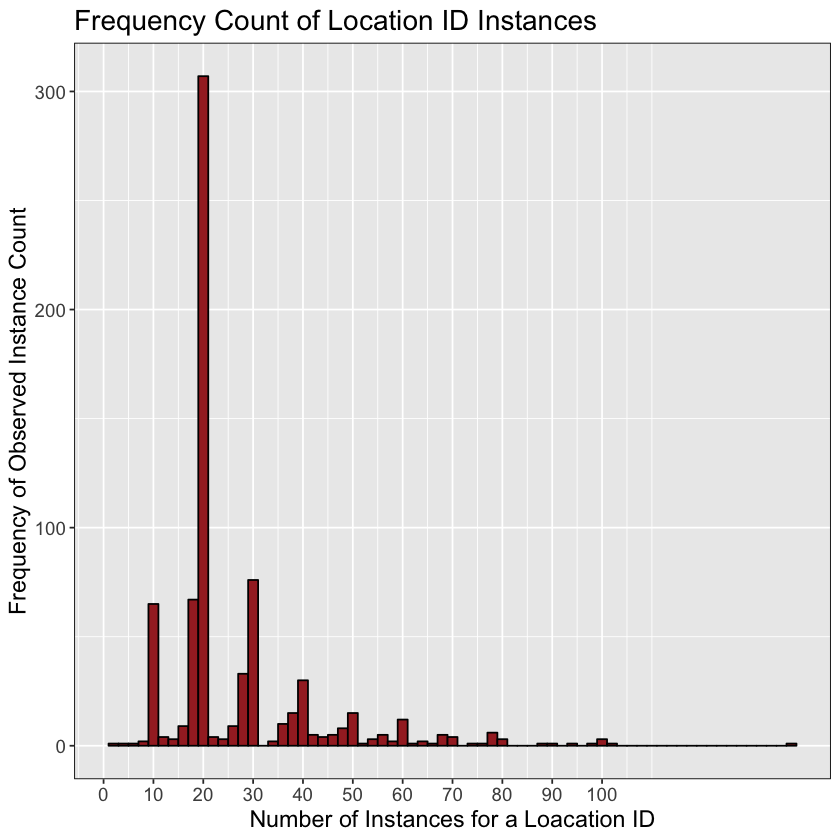

In [16]:

frequencyID <- trainingData %>%
  group_indices(BUILDINGID, FLOOR, SPACEID)

fID <- as.data.frame(table(frequencyID))

ggplot(fID, aes(x = Freq)) +
  geom_histogram(fill='brown', binwidth = 2, color='black')+
  scale_x_continuous(breaks=seq(0,100,10)) +
  ggtitle('Frequency Count of Location ID Instances') +
  xlab('Number of Instances for a Loacation ID') +
  ylab('Frequency of Observed Instance Count') +
  theme(text = element_text(size=14)) +
  theme(panel.border=element_rect(colour='black', fill=NA))


#### Distribution of WAP count 

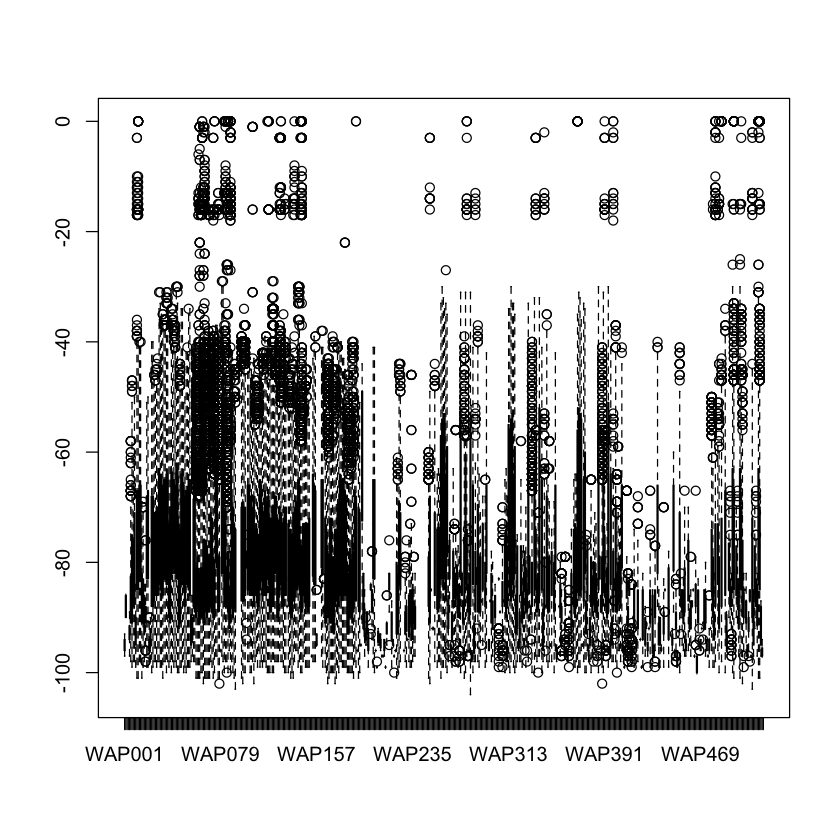

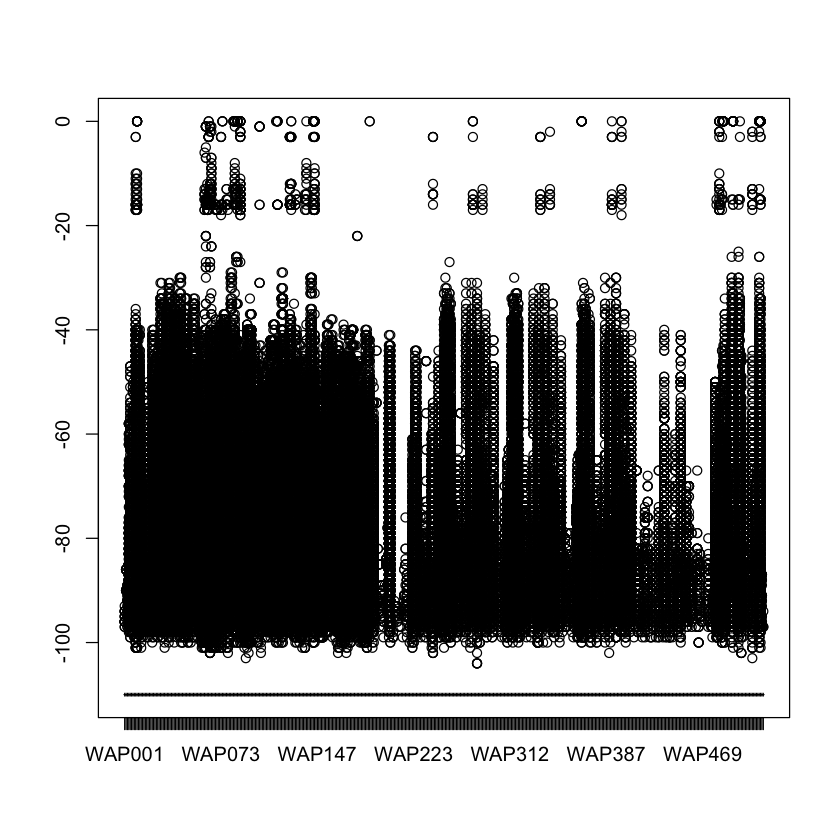

In [23]:

plot ( x = as.factor(rep(colnames(trainingData)[1:520],nrow(trainingData))), 
       y = c(t(trainingData[,1:520])))
plot ( x = as.factor(rep(colnames(trainingData_noNA)[1:465],nrow(trainingData_noNA))), 
       y = c(t(trainingData_noNA[,1:465])))

### Build Predictive Models
#### Assign values in seeds agrument of trainControl

In [14]:

set.seed(123)
seeds <- vector(mode = 'list', length=31)
for(i in 1:30) seeds[[i]] <- sample.int(1000, 518)

#for last model:
seeds[[31]] <- sample.int(1000,1)

#-Define parameters in trainControl
ctrl <- caret::trainControl(method = "repeatedcv", 
                     number = 5,
                     repeats=3,
                     allowParallel = TRUE
)

### KNN Model

#### Building ID

In [15]:


#Building ID( Removing the attributes  that won’t be needed in a predictive model. 

ttraininingData_noNA <- dplyr::select(trainingData_noNA, -RELATIVEPOSITION, -USERID, 
                               -PHONEID, -TIMESTAMP, -LONGITUDE,
                               -LATITUDE,  -SPACEID, -FLOOR)


tvalidationdata_noNA <- dplyr::select(validationData_noNA, -RELATIVEPOSITION, -USERID, 
                                 -PHONEID, -TIMESTAMP, -LONGITUDE,
                                 -LATITUDE,  -SPACEID, -FLOOR)


set.seed(123)
data_partition <- caret::createDataPartition(y=ttraininingData_noNA$BUILDINGID, p = .7, list = FALSE)
train = ttraininingData_noNA[sample(nrow(data_partition)),]
testing <- ttraininingData_noNA[-data_partition,]





In [ ]:
#fit KNN model
set.seed(1234)

#-Grid of k values to search 
knn_grid <- expand.grid(.k=c(1:5))

knn_fit <- caret::train(BUILDINGID ~., data = train,
                 method='knn',
                 preProcess = c('zv'),
                 tuneGrid=knn_grid,
                 trControl = ctrl)
knn_fit

plot(knn_fit)
knn_fit$results

In [31]:
#testset
warning = -1
messages=FALSE

knn_Pred <- predict(knn_fit, newdata = testing)
knn_Pred
knn_CM <-confusionMatrix(knn_Pred, testing$BUILDINGID)
knn_CM
postResample(knn_Pred, testing$BUILDINGID)

ERROR: Error in predict(knn_fit, newdata = testing): object 'knn_fit' not found


In [33]:
# Validationset

knn_Predvd <- predict(knn_fit, newdata = tvalidationdata_noNA)

knn_CM <-confusionMatrix(knn_Pred, testing$BUILDINGID)
knn_CM
postResample(knn_Pred, testing$BUILDINGID)


[1] 1 2 2 2 0 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 1 0 2 2 1 1 2 2 0 0 0 1 1 1 1 1 1
  [38] 1 1 1 1 1 1 1 1 1 1 2 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  [75] 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 [112] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 [149] 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [186] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [223] 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [260] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 [297] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2
 [334] 2 2 2 2 2 2 2 2 2 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 0 0 0 0
 [371] 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 [408] 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0
 [445] 0 0 1 0 0 0 0 1 0 1 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 [482] 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0
 [519] 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 1 0 1 0 0 0
 [556] 0 0 1 0 0 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 1 0
 [593] 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0
 [630] 0 0 1 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 1 0 0
 [667] 0 1 0 1 0 1 1 0 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 0 1 1 1 1 0 1 0 0 1 0 1 1 1
 [704] 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [741] 1 1 1 1 1 1 2 1 1 2 2 1 2 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2
 [778] 1 1 1 1 2 2 2 1 1 1 2 1 2 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 2 1 1 2 1 1 1 1 2
 [815] 2 2 1 2 1 1 1 1 1 2 2 2 1 1 2 2 1 1 2 1 2 1 2 2 1 1 2 2 2 2 1 2 2 2 2 1 1
 [852] 1 2 2 2 1 1 2 2 1 1 1 2 2 2 2 2 1 2 2 2 2 2 2 2 2 1 2 2 1 2 2 2 2 2 2 2 2
 [889] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 1 2 2 2 2 1 1 2 2
 [926] 1 1 2 2 2 2 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [963] 1 2 2 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2
[1000] 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2
[1037] 2 2 2 2 2 2 2 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1074] 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0
[1111] 0
Levels: 0 1 2

Confusion Matrix and Statistics

          Reference
Prediction    0    1    2
         0 1572    0    0
         1    2 1547    0
         2    0    0 2836

Overall Statistics
                                     
               Accuracy : 0.9997     
                 95% CI : (0.9988, 1)
    No Information Rate : 0.4761     
    P-Value [Acc > NIR] : < 2.2e-16  
                                     
                  Kappa : 0.9995     
 Mcnemar's Test P-Value : NA         

Statistics by Class:

                     Class: 0 Class: 1 Class: 2
Sensitivity            0.9987   1.0000   1.0000
Specificity            1.0000   0.9995   1.0000
Pos Pred Value         1.0000   0.9987   1.0000
Neg Pred Value         0.9995   1.0000   1.0000
Prevalence             0.2642   0.2597   0.4761
Detection Rate         0.2639   0.2597   0.4761
Detection Prevalence   0.2639   0.2600   0.4761
Balanced Accuracy      0.9994   0.9998   1.0000

Accuracy     Kappa 
0.9996643 0.9994722

#### Floor

k-Nearest Neighbors 

13958 samples
  465 predictor

Pre-processing: remove (25) 
Resampling: Cross-Validated (5 fold, repeated 3 times) 
Summary of sample sizes: 11168, 11165, 11166, 11166, 11167, 11167, ... 
Resampling results across tuning parameters:

  k  RMSE       Rsquared   MAE        
  1  0.1051972  0.9928003  0.007622343
  2  0.1064419  0.9926348  0.008340213
  3  0.1086682  0.9923417  0.009030687
  4  0.1104279  0.9921040  0.009732803
  5  0.1139544  0.9915949  0.010796531

RMSE was used to select the optimal model using the smallest value.
The final value used for the model was k = 1.

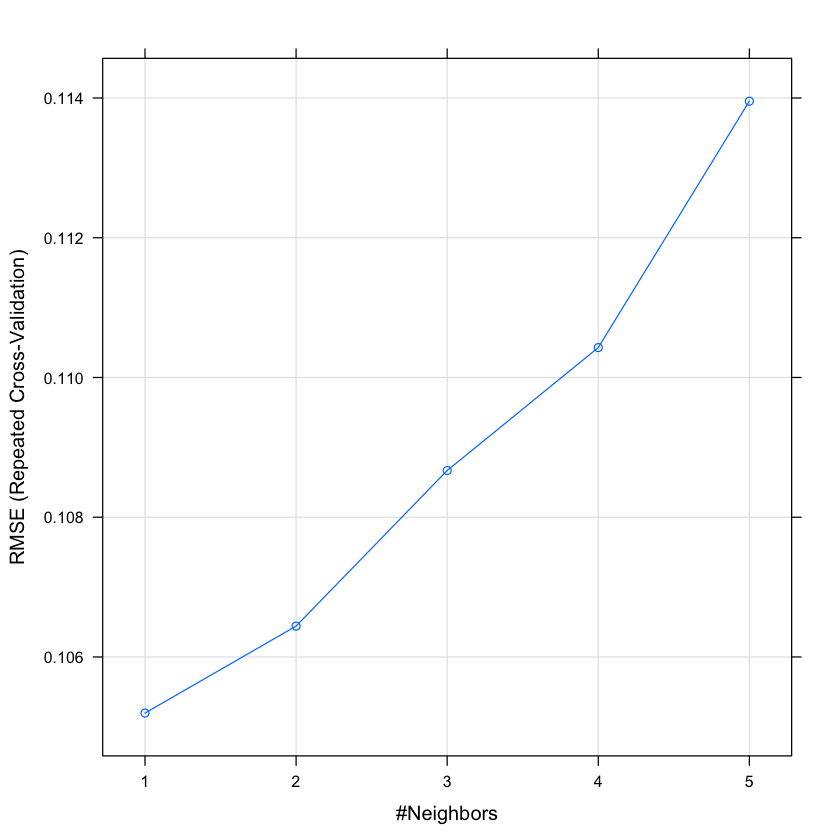

In [16]:


ttraininingData_noNAFL <- dplyr::select(trainingData_noNA, -RELATIVEPOSITION, -USERID, 
                               -PHONEID, -TIMESTAMP, -LONGITUDE,
                               -LATITUDE,  -SPACEID, -BUILDINGID)


tvalidationdata_noNAFL <- dplyr::select(validationData_noNA, -RELATIVEPOSITION, -USERID, 
                               -PHONEID, -TIMESTAMP, -LONGITUDE,
                               -LATITUDE,  -SPACEID, -BUILDINGID)


set.seed(123)
data_partition <- caret::createDataPartition(y=ttraininingData_noNAFL$FLOOR, p = .7, list = FALSE)
train = ttraininingData_noNAFL[sample(nrow(data_partition)),]
testing <- ttraininingData_noNAFL[-data_partition,]

#fit KNN model
set.seed(1234)

#-Grid of k values to search 
knn_grid <- expand.grid(.k=c(1:5))


knn_fitfloor <- caret::train(FLOOR ~., data = train,
                      method='knn',
                      preProcess = c('zv'),
                      tuneGrid=knn_grid,
                      trControl = ctrl)
knn_fitfloor

plot(knn_fitfloor)


In [21]:
#test set

knn_Predfloor <- predict(knn_fitfloor, newdata = testing)
knn_Predfloor
knn_CMF <-confusionMatrix(knn_Predfloor, testing$FLOOR)
knn_CMF
postResample(knn_Predfloor, testing$FLOOR)

#validation data

knn_Predfloorvd <- predict(knn_fitfloor, newdata = tvalidationdata_noNAFL)
knn_Predfloorvd
postResample(knn_Predfloorvd, tvalidationdata_noNAFL$FLOOR)

[1] 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000
   [9] 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 4.000000
  [17] 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000
  [25] 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000
  [33] 4.000000 4.000000 4.000000 3.000000 3.000000 3.000000 3.000000 3.000000
  [41] 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000
  [49] 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000
  [57] 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000
  [65] 4.000000 4.000000 4.000000 4.000000 3.000000 3.000000 3.000000 3.000000
  [73] 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000
  [81] 3.000000 3.000000 3.000000 3.000000 3.000000 4.000000 4.000000 4.000000
  [89] 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000
  [97] 4.000000 4.000000 4.000000 4.000000 4.000000 3.000000 3.000000 3.000000
 [105] 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000
 [113] 3.000000 3.000000 4.000000 3.000000 4.000000 4.000000 4.000000 4.000000
 [121] 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000
 [129] 4.000000 4.000000 4.000000 4.000000 4.000000 3.000000 3.000000 3.000000
 [137] 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 4.000000
 [145] 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000
 [153] 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 3.000000 3.000000
 [161] 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000
 [169] 3.000000 3.000000 3.000000 4.000000 4.000000 4.000000 4.000000 4.000000
 [177] 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000
 [185] 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 3.000000 3.000000
 [193] 4.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000
 [201] 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 4.000000 4.000000
 [209] 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000
 [217] 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000
 [225] 4.000000 4.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000
 [233] 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000
 [241] 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000
 [249] 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000
 [257] 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 3.000000 4.000000
 [265] 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000
 [273] 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 4.000000 4.000000
 [281] 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000
 [289] 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000
 [297] 4.000000 4.000000 4.000000 4.000000 4.000000 3.000000 3.000000 3.000000
 [305] 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000
 [313] 3.000000 3.000000 3.000000 3.000000 4.000000 3.000000 4.000000 4.000000
 [321] 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000
 [329] 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000 4.000000
 [337] 4.000000 4.000000 4.000000 4.000000 4.000000 5.000000 5.000000 5.000000
 [345] 5.000000 5.000000 5.000000 5.000000 5.000000 5.000000 5.000000 5.000000
 [353] 5.000000 5.000000 5.000000 5.000000 5.000000 5.000000 5.000000 5.000000
 [361] 5.000000 5.000000 5.000000 5.000000 5.000000 5.000000 5.000000 5.000000
 [369] 5.000000 5.000000 5.000000 5.000000 5.000000 5.000000 5.000000 5.000000
 [377] 5.000000 5.000000 5.000000 5.000000 5.000000 5.000000 5.000000 5.000000
 [385] 5.000000 5.000000 5.000000 5.000000 5.000000 5.000000 5.000000 5.000000
 [393] 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000 3.000000
 [401] 3.000000 3.000000 3.000000 3.000000 3.000000 3

ERROR: Error: `data` and `reference` should be factors with the same levels.


#### Latitude

In [22]:


ttraininingData_noNAlat <- dplyr::select(trainingData_noNA, -RELATIVEPOSITION, -USERID, 
                                 -PHONEID, -TIMESTAMP, -LONGITUDE,
                                 -FLOOR,  -SPACEID, -BUILDINGID)


tvalidationdata_noNAlat <- dplyr::select(validationData_noNA, -RELATIVEPOSITION, -USERID, 
                                 -PHONEID, -TIMESTAMP, -LONGITUDE,
                                 -FLOOR,  -SPACEID, -BUILDINGID)

k-Nearest Neighbors 

13904 samples
  465 predictor

Pre-processing: remove (25) 
Resampling: Cross-Validated (5 fold, repeated 3 times) 
Summary of sample sizes: 11124, 11123, 11122, 11123, 11124, 11124, ... 
Resampling results across tuning parameters:

  k  RMSE      Rsquared   MAE     
  1  3.250169  0.9974325  1.253885
  2  3.122223  0.9976324  1.386429
  3  3.139690  0.9976065  1.499606
  4  3.196267  0.9975205  1.608584
  5  3.268867  0.9974076  1.716239

RMSE was used to select the optimal model using the smallest value.
The final value used for the model was k = 2.

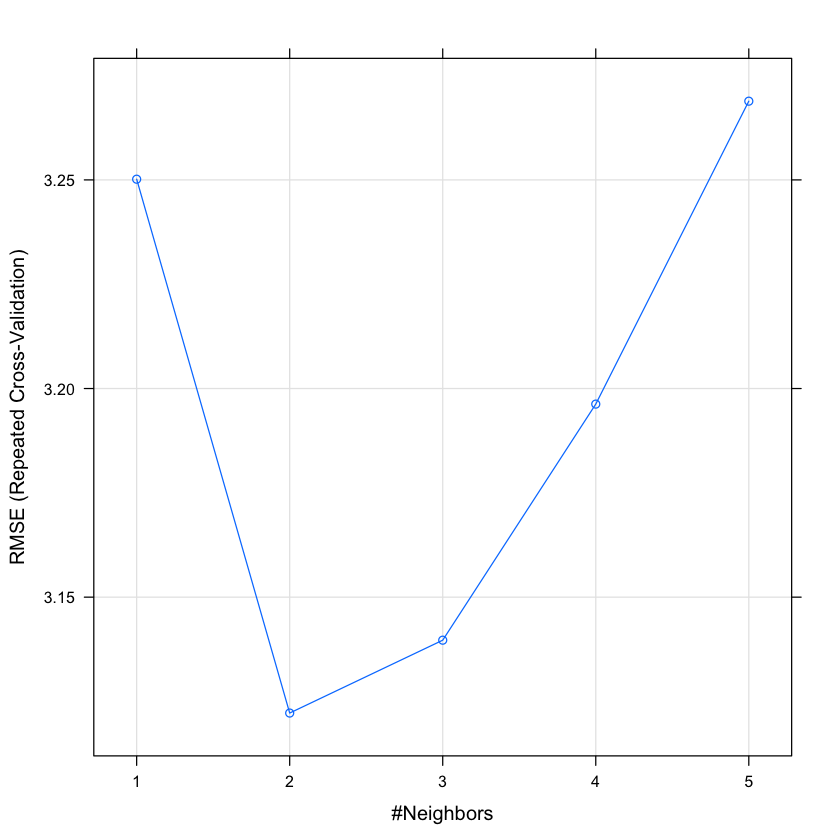

In [19]:
set.seed(123)
data_partition <- caret::createDataPartition(y=ttraininingData_noNAlat$LATITUDE, p = .7, list = FALSE)
trainlat = ttraininingData_noNAlat[sample(nrow(data_partition)),]
testinglat <- ttraininingData_noNAlat[-data_partition,]


knn_fitlatitude <- train(LATITUDE ~., data = trainlat,
                         method='knn',
                         preProcess = c('zv'),
                         tuneGrid=knn_grid,
                         trControl = ctrl)

knn_fitlatitude
plot(knn_fitlatitude)

In [20]:
#test set
knn_Predlatitude <- predict(knn_fitlatitude, newdata = testinglat)
knn_Predlatitude
postResample(knn_Predlatitude, testinglat$LATITUDE)

[1] 4864950 4864959 4864952 4864871 4864892 4864890 4864884 4864901 4864845
  [10] 4864863 4864854 4864864 4864867 4864767 4864756 4864786 4864789 4864787
  [19] 4864781 4864781 4864786 4864780 4864773 4864774 4864769 4864763 4864755
  [28] 4864928 4864918 4864950 4864889 4864944 4864949 4864891 4864884 4864863
  [37] 4864866 4864863 4864854 4864767 4864758 4864750 4864800 4864791 4864787
  [46] 4864789 4864789 4864786 4864779 4864777 4864774 4864769 4864769 4864774
  [55] 4864764 4864756 4864934 4864950 4864952 4864887 4864888 4864959 4864889
  [64] 4864869 4864867 4864896 4864893 4864901 4864900 4864851 4864845 4864860
  [73] 4864866 4864854 4864767 4864768 4864760 4864751 4864753 4864750 4864803
  [82] 4864803 4864748 4864790 4864785 4864785 4864796 4864778 4864762 4864761
  [91] 4864757 4864921 4864934 4864950 4864888 4864867 4864887 4864872 4864892
 [100] 4864885 4864888 4864888 4864895 4864900 4864865 4864860 4864864 4864768
 [109] 4864852 4864764 4864763 4864753 4864800 4864800 4864793 4864789 4864796
 [118] 4864782 4864780 4864769 4864769 4864768 4864760 4864766 4864755 4864759
 [127] 4864918 4864757 4864934 4864939 4864929 4864959 4864869 4864889 4864863
 [136] 4864900 4864851 4864845 4864866 4864864 4864863 4864854 4864859 4864763
 [145] 4864754 4864758 4864753 4864800 4864788 4864790 4864787 4864778 4864778
 [154] 4864778 4864778 4864776 4864773 4864769 4864765 4864763 4864921 4864918
 [163] 4864939 4864950 4864887 4864888 4864952 4864959 4864869 4864893 4864887
 [172] 4864885 4864901 4864851 4864863 4864863 4864845 4864859 4864878 4864854
 [181] 4864755 4864758 4864750 4864753 4864750 4864800 4864803 4864789 4864789
 [190] 4864789 4864784 4864781 4864777 4864778 4864769 4864765 4864763 4864761
 [199] 4864759 4864757 4864921 4864950 4864934 4864959 4864888 4864952 4864867
 [208] 4864893 4864884 4864895 4864842 4864851 4864854 4864863 4864867 4864867
 [217] 4864852 4864854 4864756 4864750 4864748 4864800 4864793 4864789 4864785
 [226] 4864785 4864780 4864781 4864780 4864778 4864769 4864766 4864760 4864755
 [235] 4864758 4864929 4864888 4864891 4864884 4864895 4864863 4864842 4864851
 [244] 4864854 4864767 4864763 4864750 4864803 4864785 4864786 4864779 4864781
 [253] 4864778 4864778 4864769 4864778 4864769 4864757 4864928 4864921 4864952
 [262] 4864949 4864867 4864893 4864892 4864865 4864866 4864859 4864764 4864768
 [271] 4864750 4864750 4864748 4864800 4864789 4864790 4864786 4864787 4864796
 [280] 4864781 4864778 4864782 4864765 4864761 4864766 4864766 4864761 4864761
 [289] 4864761 4864921 4864950 4864949 4864887 4864871 4864885 4864889 4864891
 [298] 4864893 4864900 4864895 4864901 4864865 4864864 4864863 4864867 4864859
 [307] 4864753 4864750 4864748 4864803 4864788 4864789 4864785 4864786 4864780
 [316] 4864796 4864778 4864778 4864774 4864773 4864768 4864764 4864761 4864759
 [325] 4864757 4864795 4864790 4864789 4864787 4864781 4864785 4864787 4864789
 [334] 4864784 4864781 4864778 4864800 4864795 4864785 4864784 4864782 4864800
 [343] 4864796 4864788 4864787 4864786 4864781 4864785 4864800 4864785 4864789
 [352] 4864786 4864784 4864784 4864781 4864778 4864796 4864789 4864788 4864785
 [361] 4864786 4864785 4864795 4864784 4864782 4864778 4864800 4864790 4864786
 [370] 4864785 4864782 4864795 4864796 4864784 4864785 4864786 4864784 4864778
 [379] 4864863 4864835 4864854 4864864 4864900 4864873 4864934 4864952 4864949
 [388] 4864948 4864872 4864867 4864930 4864887 4864844 4864866 4864900 4864938
 [397] 4864952 4864939 4864948 4864959 4864867 4864885 4864865 4864844 4864845
 [406] 4864842 4864866 4864854 4864900 4864919 4864929 4864948 4864939 4864934
 [415] 4864871 4864845 4864842 4864854 4864873 4864918 4864938 4864929 4864959
 [424] 4864865 4864863 4864842 4864845 4864864 4864900 4864895 4864918 4864919
 [433] 4864949 4864948 4864939 4864872 4864853 4864845 4864843 4864844 4864864
 [442] 4864854 4864866 4864929 4864952 4864939 4864948 4864869 4864887 4864888
 [451] 4864844 4864860 4864835 4864854 4864866 486486

RMSE Rsquared      MAE 
5.094666 0.994255 2.023872

[1] 4864896 4864839 4864848 4864844 4864921 4864822 4864846 4864763 4864765
  [10] 4864830 4864755 4864843 4864846 4864764 4864840 4864836 4864886 4864788
  [19] 4864809 4864839 4864872 4864985 4864792 4864784 4864871 4864867 4864841
  [28] 4864839 4864934 4864932 4865016 4864926 4864937 4864939 4864944 4864881
  [37] 4864829 4864819 4864810 4864822 4864896 4864887 4864918 4864918 4864919
  [46] 4864935 4864886 4864852 4864825 4864818 4864932 4864949 4864904 4864965
  [55] 4864980 4864985 4864984 4864979 4864985 4864986 4864978 4864928 4864930
  [64] 4864932 4864931 4864933 4864931 4864949 4864935 4864936 4864932 4864937
  [73] 4864927 4864932 4864932 4864927 4864921 4864921 4864903 4864926 4864982
  [82] 4864982 4864979 4864983 4864983 4864867 4864980 4864979 4864979 4864978
  [91] 4864978 4864980 4864986 4864999 4864982 4864983 4864981 4864930 4864981
 [100] 4864928 4864938 4864938 4864959 4864903 4864985 4864997 4864991 4865006
 [109] 4865001 4865009 4865007 4865004 4865012 4864950 4864948 4864937 4864978
 [118] 4864978 4864980 4864980 4864986 4864982 4864986 4864986 4864982 4864983
 [127] 4864981 4864983 4864986 4864996 4864982 4864982 4864930 4864938 4864938
 [136] 4864983 4864988 4865001 4865011 4865013 4865016 4865016 4865004 4865000
 [145] 4864984 4864985 4864983 4864965 4864950 4864950 4864982 4864983 4864982
 [154] 4864984 4864984 4864982 4864982 4864980 4864982 4864977 4864976 4864867
 [163] 4864867 4864965 4864945 4864930 4864928 4864921 4864921 4864981 4864984
 [172] 4864984 4864982 4864993 4864994 4864999 4865004 4865008 4865007 4864902
 [181] 4865015 4864903 4865008 4864898 4865016 4864928 4865008 4865011 4864946
 [190] 4864950 4864967 4864956 4864965 4864975 4864981 4864931 4864937 4864933
 [199] 4864930 4864929 4864928 4864930 4864929 4864929 4864986 4864913 4864898
 [208] 4864902 4864898 4864948 4864971 4864966 4864977 4864984 4864996 4865001
 [217] 4865013 4864982 4864983 4865017 4864981 4864982 4864980 4864986 4864978
 [226] 4864983 4864986 4864986 4864978 4864981 4864981 4864986 4864983 4864858
 [235] 4864855 4864863 4864854 4864854 4864890 4864854 4864854 4864848 4864890
 [244] 4864890 4864890 4864932 4864934 4864937 4864958 4864982 4864984 4864979
 [253] 4864917 4864906 4864902 4864921 4864928 4864929 4864930 4864924 4864921
 [262] 4864928 4864935 4864931 4864932 4864931 4864933 4864934 4864929 4864948
 [271] 4864965 4864971 4864980 4864980 4864979 4864978 4865001 4865003 4865005
 [280] 4865012 4865004 4865007 4865011 4864976 4864965 4864965 4864965 4864965
 [289] 4864965 4864994 4864975 4864957 4864948 4864948 4864984 4864934 4864951
 [298] 4864949 4864949 4864949 4864949 4864960 4864938 4864937 4864921 4864921
 [307] 4864896 4864862 4864885 4864894 4864896 4864982 4864982 4864980 4864984
 [316] 4864982 4864984 4864986 4864986 4864980 4864978 4864981 4864979 4864986
 [325] 4864979 4864978 4864979 4864982 4864984 4864979 4864996 4864989 4864792
 [334] 4864792 4864798 4864823 4864823 4864832 4864850 4864849 4864858 4864836
 [343] 4864872 4864875 4864867 4864929 4865009 4865001 4865015 4865008 4864984
 [352] 4864981 4864981 4864982 4864976 4864948 4864933 4864931 4864892 4864892
 [361] 4864892 4864892 4864888 4864886 4864886 4864892 4864921 4864928 4864922
 [370] 4864921 4864921 4864921 4864926 4864918 4864921 4864928 4864928 4864928
 [379] 4864921 4864965 4864968 4864965 4864968 4864965 4864965 4864978 4864971
 [388] 4864948 4864970 4864980 4864938 4864978 4864983 4864929 4864980 4864983
 [397] 4864935 4864986 4864975 4864980 4865004 4864986 4864992 4864937 4864937
 [406] 4864886 4864981 4864933 4864992 4865001 4864986 4864869 4864934 4864983
 [415] 4865008 4864968 4864931 4864986 4864926 4865007 4864984 4864982 4864928
 [424] 4865007 4864984 4864928 4864863 4865009 4864980 4864982 4864907 4864932
 [433] 4864978 4864933 4864918 4864982 4864921 4864934 4864976 4864886 4864936
 [442] 4864978 4864932 4864938 4864929 4864984 4864869 4864978 4864978 4864980
 [451] 4864928 4864869 4865001 4864951 4864982 486492

RMSE   Rsquared        MAE 
10.0812658  0.9798232  5.7556932

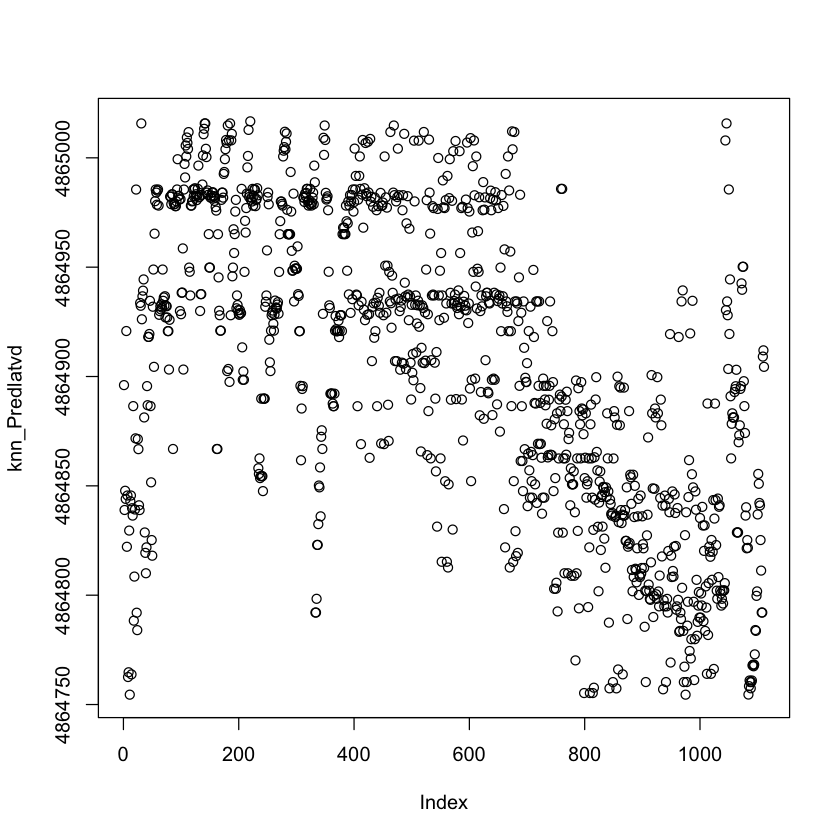

In [21]:
knn_Predlatvd <- predict(knn_fitlatitude, newdata = tvalidationdata_noNAlat)
knn_Predlatvd
plot(knn_Predlatvd)
postResample(knn_Predlatvd, tvalidationdata_noNAlat$LATITUDE)


#### Longitude

In [22]:

ttraininingData_noNAlon <- dplyr ::select(trainingData_noNA, -RELATIVEPOSITION, -USERID, 
                                  -PHONEID, -TIMESTAMP, -LATITUDE,
                                  -FLOOR,  -SPACEID, -BUILDINGID)
tvalidationdata_noNAlon <- dplyr::select(validationData_noNA, -RELATIVEPOSITION, -USERID, 
                                  -PHONEID, -TIMESTAMP, -LATITUDE,
                                  -FLOOR,  -SPACEID, -BUILDINGID)

k-Nearest Neighbors 

13958 samples
  465 predictor

Pre-processing: remove (25) 
Resampling: Cross-Validated (5 fold, repeated 3 times) 
Summary of sample sizes: 11166, 11166, 11166, 11166, 11168, 11167, ... 
Resampling results across tuning parameters:

  k  RMSE      Rsquared   MAE     
  1  7.575007  0.9955310  1.908935
  2  7.495848  0.9956119  2.063707
  3  7.555647  0.9955422  2.217332
  4  7.725054  0.9953437  2.359744
  5  7.916709  0.9951029  2.504511

RMSE was used to select the optimal model using the smallest value.
The final value used for the model was k = 2.

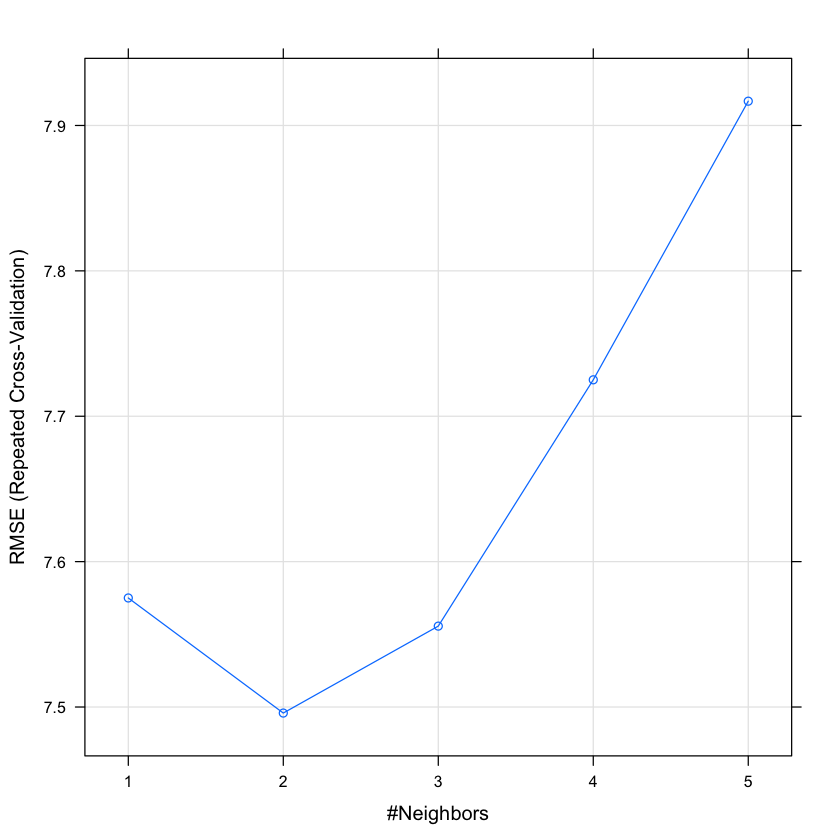

In [23]:
set.seed(123)
data_partition <- createDataPartition(y=ttraininingData_noNAlon$LONGITUDE, p = .7, list = FALSE)
train = ttraininingData_noNAlon[sample(nrow(data_partition)),]
testing <- ttraininingData_noNAlon[-data_partition,]

#fit KNN model
set.seed(123)

#-Grid of k values to search 
knn_grid <- expand.grid(.k=c(1:5))

knn_fitlongitude <- train(LONGITUDE ~., data = train,
                         method='knn',
                         preProcess = c('zv'),
                         tuneGrid=knn_grid,
                         trControl = ctrl)
knn_fitlongitude
plot(knn_fitlongitude)

In [28]:
#test data set
knn_Predlongi <- predict(knn_fitlongitude, newdata = testing)
knn_Predlongi

postResample(knn_Predlongi, testing$LONGITUDE)

#validation data
knn_Predlonvd <- predict(knn_fitlongitude, newdata = tvalidationdata_noNAlon)
knn_Predlonvd

postResample(knn_Predlonvd, tvalidationdata_noNAlon$LONGITUDE)





[1] -7519.152 -7444.402 -7528.816 -7523.628 -7559.782 -7555.132 -7521.867
   [8] -7526.711 -7516.841 -7502.450 -7482.456 -7491.031 -7502.827 -7511.737
  [15] -7516.475 -7506.529 -7480.431 -7458.264 -7337.395 -7341.215 -7339.154
  [22] -7337.232 -7344.211 -7413.155 -7405.101 -7404.705 -7397.860 -7395.101
  [29] -7444.402 -7384.211 -7391.084 -7377.651 -7370.615 -7363.612 -7356.010
  [36] -7352.932 -7352.496 -7527.451 -7510.437 -7562.186 -7537.340 -7516.841
  [43] -7506.732 -7511.737 -7502.827 -7511.521 -7329.620 -7457.753 -7331.574
  [50] -7344.211 -7341.215 -7344.968 -7341.683 -7413.921 -7413.955 -7401.408
  [57] -7403.736 -7384.883 -7395.101 -7369.414 -7370.615 -7368.386 -7376.449
  [64] -7366.705 -7366.078 -7356.978 -7356.010 -7536.621 -7536.610 -7533.896
  [71] -7555.132 -7562.186 -7537.340 -7521.867 -7520.725 -7502.450 -7501.222
  [78] -7511.737 -7491.031 -7474.653 -7474.582 -7470.519 -7338.960 -7341.215
  [85] -7344.211 -7344.968 -7339.154 -7344.968 -7413.921 -7413.155 -7403.736
  [92] -7398.003 -7396.896 -7385.373 -7376.401 -7369.632 -7369.414 -7377.651
  [99] -7373.019 -7370.615 -7370.345 -7352.475 -7536.598 -7527.451 -7348.013
 [106] -7536.621 -7524.570 -7533.896 -7523.628 -7528.816 -7565.284 -7562.186
 [113] -7523.718 -7537.340 -7521.311 -7516.089 -7482.456 -7489.177 -7501.222
 [120] -7506.732 -7511.737 -7470.519 -7498.260 -7480.431 -7331.400 -7336.700
 [127] -7337.395 -7340.525 -7347.108 -7410.329 -7408.288 -7413.921 -7406.063
 [134] -7404.705 -7398.111 -7399.110 -7398.003 -7392.357 -7395.101 -7385.373
 [141] -7368.386 -7349.280 -7350.147 -7536.598 -7348.013 -7527.451 -7528.762
 [148] -7564.196 -7562.186 -7520.725 -7480.124 -7501.222 -7511.737 -7506.529
 [155] -7511.521 -7469.739 -7474.618 -7327.492 -7342.713 -7347.412 -7347.108
 [162] -7344.968 -7408.288 -7413.955 -7411.251 -7413.921 -7406.063 -7399.110
 [169] -7396.896 -7392.357 -7391.359 -7395.101 -7390.096 -7377.651 -7376.401
 [176] -7361.541 -7348.013 -7348.898 -7541.264 -7536.598 -7536.621 -7533.896
 [183] -7537.340 -7571.093 -7523.718 -7521.311 -7516.089 -7489.177 -7502.450
 [190] -7480.124 -7502.827 -7501.222 -7511.521 -7495.336 -7458.264 -7331.748
 [197] -7344.968 -7410.329 -7407.380 -7411.251 -7403.736 -7415.163 -7390.649
 [204] -7391.359 -7383.266 -7358.080 -7363.996 -7348.898 -7536.598 -7528.762
 [211] -7519.152 -7559.497 -7510.437 -7571.093 -7564.196 -7537.340 -7521.867
 [218] -7512.604 -7516.841 -7482.456 -7501.222 -7489.177 -7502.827 -7506.732
 [225] -7511.521 -7498.260 -7504.881 -7506.529 -7466.291 -7331.400 -7339.154
 [232] -7337.232 -7347.108 -7408.288 -7408.288 -7411.251 -7413.955 -7396.896
 [239] -7390.649 -7385.373 -7383.266 -7384.211 -7369.632 -7377.651 -7354.720
 [246] -7348.898 -7536.598 -7537.580 -7538.943 -7527.451 -7524.570 -7523.628
 [253] -7528.816 -7565.438 -7555.132 -7518.407 -7517.377 -7526.711 -7489.177
 [260] -7512.604 -7501.222 -7482.456 -7491.031 -7511.521 -7469.739 -7480.431
 [267] -7458.264 -7339.154 -7344.968 -7404.705 -7397.860 -7396.830 -7393.093
 [274] -7384.393 -7372.394 -7377.651 -7363.038 -7354.720 -7350.147 -7348.898
 [281] -7527.451 -7523.628 -7559.497 -7516.089 -7489.177 -7511.521 -7504.881
 [288] -7474.653 -7469.739 -7461.524 -7457.242 -7474.582 -7340.525 -7339.154
 [295] -7410.329 -7413.921 -7413.155 -7413.955 -7399.110 -7415.163 -7397.860
 [302] -7396.896 -7390.649 -7385.373 -7384.211 -7372.394 -7350.147 -7355.840
 [309] -7349.280 -7527.451 -7536.598 -7510.437 -7528.816 -7564.196 -7571.093
 [316] -7559.497 -7562.186 -7520.725 -7480.124 -7502.827 -7470.519 -7474.582
 [323] -7466.291 -7457.242 -7461.524 -7340.525 -7347.108 -7411.251 -7405.582
 [330] -7397.860 -7398.111 -7396.896 -7391.359 -7370.615 -7369.632 -7368.386
 [337] -7356.978 -7361.541 -7354.720 -7352.932 -7413.155 -7413.921 -7406.063
 [344] -7399.110 -7404.705 -7392.357 -7407.406 -7409.742 -7401.408 -7404.705
 [351] -7391.858 -7407.406 -7413.155 -7403.736 -7397.860 -7404.705 -7392.357
 [358] -7405.101 -7413.955 -7399.110 -7403.736 -7409.385 -7398.111 -7406.063

RMSE   Rsquared        MAE 
11.3551278  0.9915562  3.1955749

numeric(0)

RMSE Rsquared      MAE 
      NA       NA       NA

In [ ]:
#validation data
knn_Predlonvd <- predict(knn_fitlongitude, newdata = tvalidationdata_noNAlon)
knn_Predlonvd

postResample(knn_Predlonvd, tvalidationdata_noNAlon$LONGITUDE)


C5.0 

13904 samples
  465 predictor
    3 classes: '0', '1', '2' 

Pre-processing: remove (25) 
Resampling: Cross-Validated (5 fold, repeated 3 times) 
Summary of sample sizes: 11123, 11123, 11124, 11123, 11123, 11123, ... 
Resampling results across tuning parameters:

  model  winnow  trials  Accuracy   Kappa    
  rules  FALSE    1      0.9979861  0.9966406
  rules  FALSE   10      0.9998322  0.9997204
  rules  FALSE   20      0.9999041  0.9998402
  rules   TRUE    1      0.9976026  0.9960001
  rules   TRUE   10      0.9984177  0.9973619
  rules   TRUE   20      0.9985136  0.9975210
  tree   FALSE    1      0.9972669  0.9954416
  tree   FALSE   10      0.9999041  0.9998402
  tree   FALSE   20      0.9999281  0.9998802
  tree    TRUE    1      0.9971951  0.9953205
  tree    TRUE   10      0.9982020  0.9970021
  tree    TRUE   20      0.9984177  0.9973610

Accuracy was used to select the optimal model using the largest value.
The final values used for the model were trials = 20, model

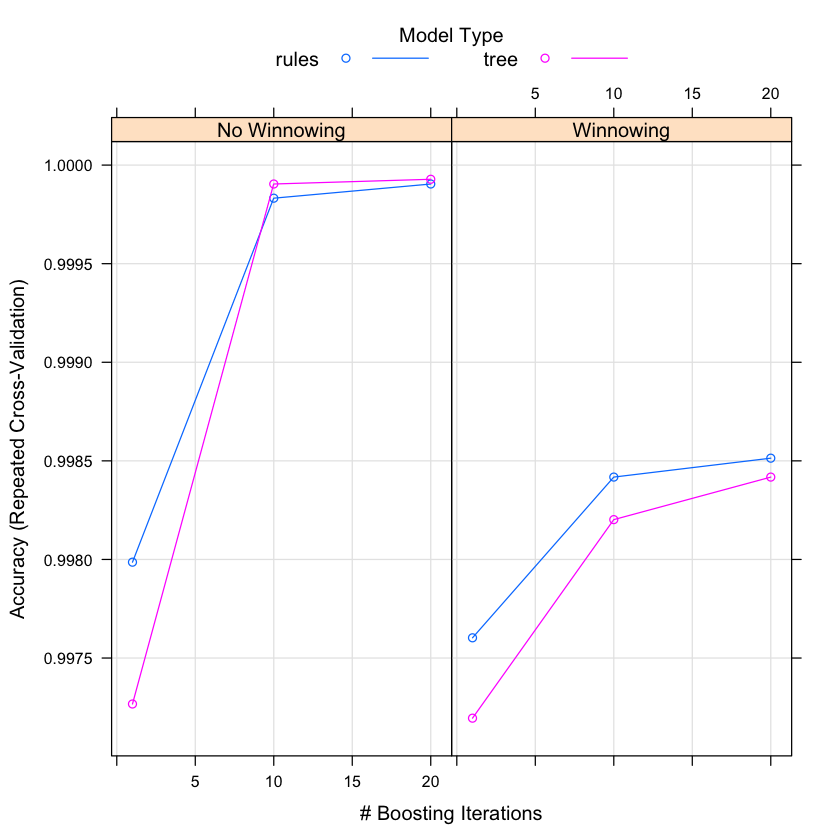

In [16]:
##### decision tree (C5.0) model

###Building ID

ttraininingData_noNA <- dplyr::select(trainingData_noNA, -RELATIVEPOSITION, -USERID, 
                               -PHONEID, -TIMESTAMP, -LONGITUDE,
                               -LATITUDE,  -SPACEID, -FLOOR)


tvalidationdata_noNA <- dplyr::select(validationData_noNA, -RELATIVEPOSITION, -USERID, 
                                 -PHONEID, -TIMESTAMP, -LONGITUDE,
                                 -LATITUDE,  -SPACEID, -FLOOR)


set.seed(123)
data_partition <- caret::createDataPartition(y=ttraininingData_noNA$BUILDINGID, p = .7, list = FALSE)
train = ttraininingData_noNA[sample(nrow(data_partition)),]
testing <- ttraininingData_noNA[-data_partition,]




set.seed(123)

d_fit <- train(BUILDINGID~., data = train,
                          method='C5.0',
                          preProcess = c('zv'),
                          trControl = ctrl)

d_fit
plot(d_fit)

In [17]:
#testset

dfit_Pred <- predict(d_fit, newdata = testing)
dfit_Pred
dfit_CM <-confusionMatrix(dfit_Pred, testing$BUILDINGID)
dfit_CM
postResample(dfit_Pred, testing$BUILDINGID)

[1] 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1
  [38] 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 2
  [75] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2
 [112] 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2
 [149] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2
 [186] 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [223] 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [260] 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1
 [297] 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [334] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [371] 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [408] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [445] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [482] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [519] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [556] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [593] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [630] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [667] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [704] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [741] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [778] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [815] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [852] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [889] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [926] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [963] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2
[1000] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2
[1037] 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1074] 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1111] 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1
[1148] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1
[1185] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1222] 2 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1259] 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1296] 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2
[1333] 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2
[1370] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 2 2 2 2 1 2 1 2 1 1 1 1 2 2 2 2 2
[1407] 2 2 2 2 2 2 1 1 1 1 2 2 2 2 2 2 2 1 1 1 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1
[1444] 2 2 2 2 2 2 2 1 1 2 2 2 2 2 2 2 2 1 1 2 2 2 2 1 1 1 1 1 1 1 2 2 2 2 2 2 2
[1481] 2 2 2 2 2 1 1 1 1 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1
[1518] 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2
[1555] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2
[1592] 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2
[1629] 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1
[1666] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1703] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1740] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1777] 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 1 1 1
[1814] 1 1 1 1 1 1 1 1 1 1 2 2 2 2

Confusion Matrix and Statistics

          Reference
Prediction    0    1    2
         0 1574    0    0
         1    0 1545    0
         2    0    2 2836

Overall Statistics
                                     
               Accuracy : 0.9997     
                 95% CI : (0.9988, 1)
    No Information Rate : 0.4761     
    P-Value [Acc > NIR] : < 2.2e-16  
                                     
                  Kappa : 0.9995     
 Mcnemar's Test P-Value : NA         

Statistics by Class:

                     Class: 0 Class: 1 Class: 2
Sensitivity            1.0000   0.9987   1.0000
Specificity            1.0000   1.0000   0.9994
Pos Pred Value         1.0000   1.0000   0.9993
Neg Pred Value         1.0000   0.9995   1.0000
Prevalence             0.2642   0.2597   0.4761
Detection Rate         0.2642   0.2594   0.4761
Detection Prevalence   0.2642   0.2594   0.4764
Balanced Accuracy      1.0000   0.9994   0.9997

Accuracy     Kappa 
0.9996643 0.9994721

In [18]:
## Validationset

dfit_Predvd <- predict(d_fit, newdata = tvalidationdata_noNA)
dfit_Predvd
dfit_CMvd <-confusionMatrix(dfit_Predvd, tvalidationdata_noNA$BUILDINGID)
dfit_CMvd
postResample(dfit_Predvd, tvalidationdata_noNA$BUILDINGID)

[1] 1 2 2 2 0 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 1 1 2 2 1 1 2 2 0 0 0 1 1 1 1 1 1
  [38] 1 1 1 1 1 1 1 1 1 1 2 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  [75] 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 [112] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 [149] 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [186] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [223] 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [260] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 [297] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2
 [334] 2 2 2 2 2 2 2 2 2 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 0 0 0 0
 [371] 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 [408] 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0
 [445] 0 0 1 0 0 0 0 1 0 1 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 [482] 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0
 [519] 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 1 0 1 0 0 0
 [556] 0 0 1 0 0 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 1 0
 [593] 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0
 [630] 0 0 1 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 1 0 0
 [667] 0 1 0 1 0 1 1 0 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 0 1 1 1 1 0 1 0 0 1 0 1 1 1
 [704] 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 0 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [741] 1 1 1 1 1 1 2 1 1 2 2 1 2 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2
 [778] 1 1 1 1 2 2 2 1 1 1 2 1 2 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 2 1 1 2 1 1 1 1 2
 [815] 2 2 1 2 1 1 1 1 1 2 2 2 1 1 2 2 1 1 2 1 2 1 2 2 1 1 2 2 2 2 1 2 2 2 2 1 1
 [852] 1 2 2 2 1 1 2 2 1 1 1 2 2 2 2 2 1 2 2 2 2 2 2 2 2 1 2 2 1 2 2 2 2 2 2 2 2
 [889] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 1 2 2 2 2 1 1 2 2
 [926] 2 1 2 2 2 2 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [963] 1 2 2 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2
[1000] 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2
[1037] 2 2 2 2 2 2 2 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1074] 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0
[1111] 0
Levels: 0 1 2

Confusion Matrix and Statistics

          Reference
Prediction   0   1   2
         0 535   1   0
         1   1 306   0
         2   0   0 268

Overall Statistics
                                          
               Accuracy : 0.9982          
                 95% CI : (0.9935, 0.9998)
    No Information Rate : 0.4824          
    P-Value [Acc > NIR] : < 2.2e-16       
                                          
                  Kappa : 0.9972          
 Mcnemar's Test P-Value : NA              

Statistics by Class:

                     Class: 0 Class: 1 Class: 2
Sensitivity            0.9981   0.9967   1.0000
Specificity            0.9983   0.9988   1.0000
Pos Pred Value         0.9981   0.9967   1.0000
Neg Pred Value         0.9983   0.9988   1.0000
Prevalence             0.4824   0.2763   0.2412
Detection Rate         0.4815   0.2754   0.2412
Detection Prevalence   0.4824   0.2763   0.2412
Balanced Accuracy      0.9982   0.9977   1.0000

Accuracy     Kappa 
0.9981998 0.9971548

C5.0 

13905 samples
  465 predictor
    5 classes: '0', '1', '2', '3', '4' 

Pre-processing: remove (25) 
Resampling: Cross-Validated (5 fold, repeated 3 times) 
Summary of sample sizes: 11124, 11125, 11124, 11124, 11123, 11123, ... 
Resampling results across tuning parameters:

  model  winnow  trials  Accuracy   Kappa    
  rules  FALSE    1      0.9749729  0.9678575
  rules  FALSE   10      0.9952537  0.9939055
  rules  FALSE   20      0.9968358  0.9959368
  rules   TRUE    1      0.9764350  0.9697403
  rules   TRUE   10      0.9939830  0.9922734
  rules   TRUE   20      0.9958288  0.9946438
  tree   FALSE    1      0.9703224  0.9618893
  tree   FALSE   10      0.9941989  0.9925500
  tree   FALSE   20      0.9954693  0.9941816
  tree    TRUE    1      0.9722878  0.9644173
  tree    TRUE   10      0.9933355  0.9914418
  tree    TRUE   20      0.9951814  0.9938122

Accuracy was used to select the optimal model using the largest value.
The final values used for the model were trials =

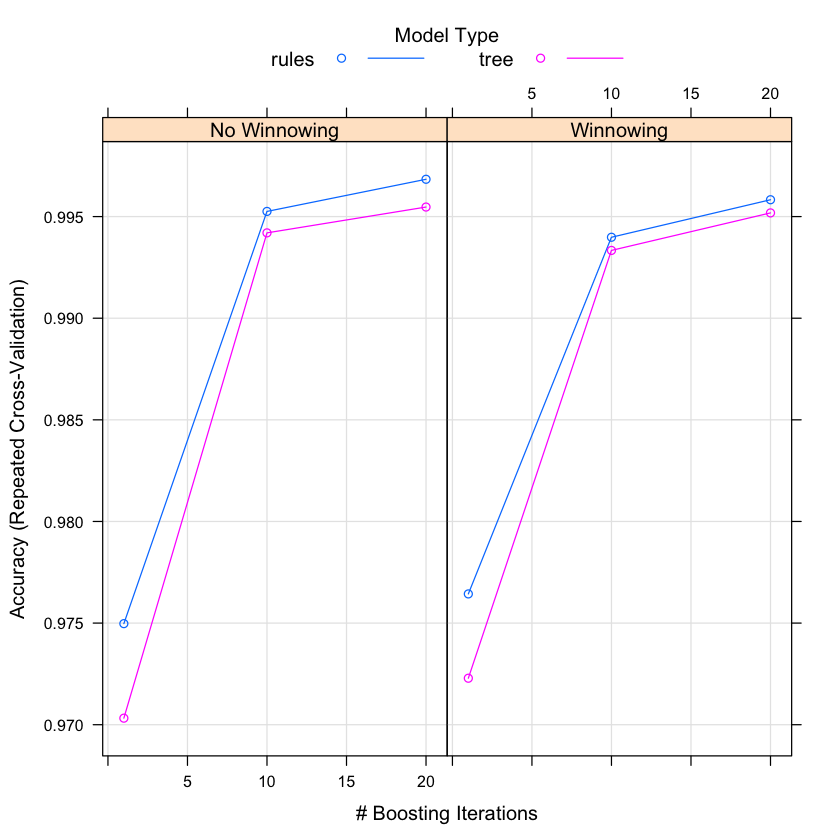

In [14]:
### Floor

ttraininingData_noNAFL <- dplyr::select(trainingData_noNA, -RELATIVEPOSITION, -USERID, 
                               -PHONEID, -TIMESTAMP, -LONGITUDE,
                               -LATITUDE,  -SPACEID, -BUILDINGID)


tvalidationdata_noNAFL <- dplyr::select(validationData_noNA, -RELATIVEPOSITION, -USERID, 
                               -PHONEID, -TIMESTAMP, -LONGITUDE,
                               -LATITUDE,  -SPACEID, -BUILDINGID)


set.seed(123)
data_partition <- caret::createDataPartition(y=ttraininingData_noNAFL$FLOOR, p = .7, list = FALSE)
train = ttraininingData_noNAFL[sample(nrow(data_partition)),]
testing <- ttraininingData_noNAFL[-data_partition,]

d_fitfloor <- train(FLOOR~., data = train,
               method='C5.0',
               preProcess = c('zv'),
               trControl = ctrl)
d_fitfloor
plot(d_fitfloor)

In [15]:
d_Predfloor <- predict(d_fitfloor, newdata = testing)
d_Predfloor
d_CMF <-confusionMatrix(d_Predfloor, testing$FLOOR)
d_CMF
postResample(d_Predfloor, testing$FLOOR)

[1] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2
  [38] 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2
  [75] 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 2 2 2 2 2 2 2
 [112] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3
 [149] 3 3 3 3 3 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2
 [186] 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2
 [223] 2 2 2 2 2 2 2 3 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2
 [260] 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 2 2 2 2 2
 [297] 2 2 2 2 2 2 2 3 3 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4
 [334] 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 [371] 4 4 4 4 4 4 4 4 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [408] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [445] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [482] 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 2
 [519] 3 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 3 3 3 3 3 3 3 3
 [556] 3 3 3 3 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3
 [593] 3 3 3 3 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3
 [630] 3 3 3 3 3 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3
 [667] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3
 [704] 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 4 3 3 3 3 3 3 3 3 3
 [741] 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 [778] 3 4 4 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 3
 [815] 4 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 3 3 3 3 4 4 4 4
 [852] 4 4 4 4 4 4 4 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 [889] 4 4 4 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 3 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 3
 [926] 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 0 4 0 0 0 0 0 0 0 0 0 0 0 0 0
 [963] 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1
[1000] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0
[1037] 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1074] 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1111] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1
[1148] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1185] 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0
[1222] 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1259] 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1296] 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1333] 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1370] 1 1 1 1 1 1 3 3 0 0 0 0 0 0 0 3 3 3 3 3 3 0 0 0 0 0 0 0 0 0 3 0 3 3 3 3 3
[1407] 3 0 0 0 0 0 0 3 3 3 0 3 3 3 0 0 0 0 0 0 0 0 0 3 3 3 3 3 3 0 0 0 0 0 0 0 0
[1444] 0 0 0 0 3 3 3 3 3 3 0 0 0 0 0 0 0 0 3 3 3 3 3 0 0 0 0 0 0 0 0 0 0 0 0 0 3
[1481] 3 3 3 3 3 3 0 0 0 0 0 0 0 0 0 0 0 0 3 3 0 3 3 3 0 0 0 0 0 0 0 0 0 3 0 3 3
[1518] 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 3 2 3 3 3 3 3 3 3 0 0 0 0 0 0 0 0 0
[1555] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 3 3 2 2 2 2 2 2 2 2 2 3 0 3 3 0 0 0 0
[1592] 0 0 2 3 2 2 2 2 2 2 2 2 2 3 3 3 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0
[1629] 0 2 3 2 2 2 2 3 2 3 3 3 3 3 3 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 3 3
[1666] 3 2 2 2 2 2 2 2 2 3 3 3 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2
[1703] 3 3 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 3 2 2 2 2 2 2 2 2 2 3 3 3
[1740] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 3 3 2 2 2 2 2 2 2 3 3 3 0 0 0 0 0 0 0 0 0 0
[1777] 0 0 0 0 0 0 0 2 0 2 2 2 3 3 3 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 0 0 0 0 0 0 0
[1814] 0 0 0 0 0 0 0 2 2 2 2 2 2 2

Confusion Matrix and Statistics

          Reference
Prediction    0    1    2    3    4
         0 1263   26    0    0    0
         1   33 1391   22    0    0
         2    3   73 1265   61    0
         3    0   10   37 1442    0
         4    0    0    0    0  330

Overall Statistics
                                        
               Accuracy : 0.9555        
                 95% CI : (0.95, 0.9606)
    No Information Rate : 0.2524        
    P-Value [Acc > NIR] : < 2.2e-16     
                                        
                  Kappa : 0.9425        
 Mcnemar's Test P-Value : NA            

Statistics by Class:

                     Class: 0 Class: 1 Class: 2 Class: 3 Class: 4
Sensitivity            0.9723   0.9273   0.9554   0.9594  1.00000
Specificity            0.9944   0.9877   0.9704   0.9894  1.00000
Pos Pred Value         0.9798   0.9620   0.9023   0.9684  1.00000
Neg Pred Value         0.9923   0.9758   0.9870   0.9863  1.00000
Prevalence             0.2181 

Accuracy     Kappa 
0.9555071 0.9424539

In [16]:
#validation data

d_Predfloorvd <- predict(d_fitfloor, newdata = tvalidationdata_noNAFL)
d_Predfloorvd
postResample(d_Predfloorvd, tvalidationdata_noNAFL$FLOOR)

[1] 2 4 4 4 2 2 3 3 4 0 3 0 0 2 0 1 3 4 1 1 3 0 4 4 0 0 1 1 2 2 1 2 2 2 2 2 3
  [38] 3 3 3 3 3 3 3 3 3 3 3 3 3 0 1 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0
  [75] 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0
 [112] 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2
 [149] 1 0 0 0 0 0 2 2 2 2 2 2 2 0 0 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 2 1 2 1 2 1
 [186] 2 1 1 2 0 1 2 0 1 1 3 3 3 3 3 3 3 3 3 1 3 3 3 3 3 3 3 3 3 3 3 3 1 1 0 1 1
 [223] 1 1 3 1 1 1 3 3 3 3 3 2 2 1 1 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 2 2 2 2 2 2
 [260] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 0 1 1
 [297] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [334] 1 1 1 1 1 1 1 1 1 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 2 2 2 2
 [371] 2 2 2 0 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 3 1 2 1 3 1 1 1 1
 [408] 1 3 3 1 1 1 1 3 1 1 2 1 3 2 2 1 2 3 1 2 2 2 2 1 2 2 3 2 2 1 2 2 1 1 3 2 1
 [445] 2 2 1 2 2 3 2 0 2 1 3 2 2 1 0 0 1 2 2 2 2 1 1 2 2 0 2 1 2 2 2 3 1 2 0 1 3
 [482] 1 2 0 2 2 2 2 3 2 2 0 2 1 1 3 1 1 2 1 1 1 1 0 3 1 2 1 2 1 0 0 2 1 2 2 2 1
 [519] 1 1 2 1 1 2 0 3 2 1 2 2 0 3 2 1 1 3 1 0 1 1 2 2 1 1 3 2 1 1 1 2 2 1 1 3 3
 [556] 1 0 1 3 1 1 3 1 2 3 1 1 1 1 3 0 3 2 3 2 3 2 2 1 3 1 2 3 2 1 3 2 1 2 1 1 1
 [593] 2 0 1 3 3 2 3 3 2 3 0 2 3 3 2 3 3 1 3 3 0 1 2 2 3 0 0 1 1 0 3 3 2 2 3 3 3
 [630] 1 0 2 1 0 1 2 0 3 3 1 2 1 1 3 0 2 0 1 1 3 3 0 1 0 1 2 3 0 1 0 0 1 2 1 0 3
 [667] 2 1 2 1 0 1 1 0 2 1 0 2 1 0 1 1 3 1 1 2 1 0 1 2 1 1 1 1 2 1 2 2 2 2 0 2 3
 [704] 2 2 3 2 0 2 2 3 1 0 1 1 1 1 1 1 1 1 1 0 1 2 1 2 0 1 2 2 2 1 1 1 2 2 2 1 1
 [741] 2 2 2 1 2 2 3 2 1 1 2 2 1 2 3 2 1 2 1 1 1 2 2 3 2 2 2 1 3 2 2 2 2 1 2 1 1
 [778] 1 1 2 1 3 2 2 2 2 2 2 1 2 2 3 2 2 3 2 2 2 1 1 2 2 2 2 2 3 3 1 1 2 2 2 2 1
 [815] 4 1 2 3 2 2 2 2 2 2 1 1 2 1 3 4 3 2 1 2 1 1 1 1 2 2 1 3 2 1 3 1 4 1 2 3 2
 [852] 2 1 4 2 3 2 2 1 2 3 2 1 1 1 2 4 2 1 1 1 1 1 2 1 1 2 4 1 3 1 0 2 1 1 1 4 1
 [889] 2 1 1 1 4 2 1 1 4 2 1 0 4 1 1 2 1 3 0 4 2 2 1 1 4 2 1 0 2 2 0 2 2 1 2 2 1
 [926] 3 2 2 1 2 2 0 1 2 2 0 1 1 2 2 3 1 4 1 2 2 2 1 0 3 2 2 2 1 3 2 2 4 1 1 3 2
 [963] 1 0 4 2 2 1 2 1 4 2 2 0 2 3 3 4 2 0 1 2 3 2 3 1 3 1 2 2 4 1 0 2 4 4 2 1 4
[1000] 1 4 1 0 4 1 1 1 1 4 0 0 0 2 4 1 1 0 0 1 0 1 0 0 1 1 1 0 1 1 1 0 1 0 1 1 1
[1037] 2 1 1 1 1 1 1 1 2 1 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 2 3 3 3 3 3 3 3
[1074] 3 3 3 3 3 4 4 4 4 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 0
[1111] 1
Levels: 0 1 2 3 4

Accuracy     Kappa 
0.8982898 0.8578771

In [16]:
####Random Forest

##Building

warning = -1
messages=FALSE


ttraininingData_noNA <- dplyr::select(trainingData_noNA, -RELATIVEPOSITION, -USERID, 
                               -PHONEID, -TIMESTAMP, -LONGITUDE,
                               -LATITUDE,  -SPACEID, -FLOOR)


tvalidationdata_noNA <- dplyr::select(validationData_noNA, -RELATIVEPOSITION, -USERID, 
                                 -PHONEID, -TIMESTAMP, -LONGITUDE,
                                 -LATITUDE,  -SPACEID, -FLOOR)


set.seed(123)
data_partition <- caret::createDataPartition(y=ttraininingData_noNA$BUILDINGID, p = .7, list = FALSE)
train = ttraininingData_noNA[sample(nrow(data_partition)),]
testing <- ttraininingData_noNA[-data_partition,]

rf_fit <- train(BUILDINGID ~., data = train,
                 method ='ranger',
                 preProcess = c('zv'),
                 trControl = ctrl)
rf_fit
plot(rf_fit)

ERROR: Error in train(BUILDINGID ~ ., data = train, method = "ranger", preProcess = c("zv"), : could not find function "train"


In [18]:
#testset
rf_Pred <- predict(rf_fit, newdata = testing)
rf_Pred
rf_CM <-confusionMatrix(rf_Pred, testing$BUILDINGID)
rf_CM
postResample(rf_Pred, testing$BUILDINGID)


[1] 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1
  [38] 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 2
  [75] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2
 [112] 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2
 [149] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2
 [186] 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [223] 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [260] 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1
 [297] 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [334] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [371] 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [408] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [445] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [482] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [519] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [556] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [593] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [630] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [667] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [704] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [741] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [778] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [815] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [852] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [889] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [926] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [963] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2
[1000] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2
[1037] 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1074] 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1111] 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1
[1148] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1
[1185] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1222] 2 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1259] 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1296] 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2
[1333] 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2
[1370] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 2 2 2 2 1 2 1 2 1 1 1 1 2 2 2 2 2
[1407] 2 2 2 2 2 2 1 1 1 1 2 2 2 2 2 2 2 1 1 1 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1
[1444] 2 2 2 2 2 2 2 1 1 2 2 2 2 2 2 2 2 1 1 2 2 2 2 1 1 1 1 1 1 1 2 2 2 2 2 2 2
[1481] 2 2 2 2 2 1 1 1 1 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1
[1518] 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2
[1555] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2
[1592] 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2
[1629] 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1
[1666] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1703] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1740] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1777] 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 1 1 1
[1814] 1 1 1 1 1 1 1 1 1 1 2 2 2 2

Confusion Matrix and Statistics

          Reference
Prediction    0    1    2
         0 1574    0    0
         1    0 1545    0
         2    0    2 2836

Overall Statistics
                                     
               Accuracy : 0.9997     
                 95% CI : (0.9988, 1)
    No Information Rate : 0.4761     
    P-Value [Acc > NIR] : < 2.2e-16  
                                     
                  Kappa : 0.9995     
 Mcnemar's Test P-Value : NA         

Statistics by Class:

                     Class: 0 Class: 1 Class: 2
Sensitivity            1.0000   0.9987   1.0000
Specificity            1.0000   1.0000   0.9994
Pos Pred Value         1.0000   1.0000   0.9993
Neg Pred Value         1.0000   0.9995   1.0000
Prevalence             0.2642   0.2597   0.4761
Detection Rate         0.2642   0.2594   0.4761
Detection Prevalence   0.2642   0.2594   0.4764
Balanced Accuracy      1.0000   0.9994   0.9997

Accuracy     Kappa 
0.9996643 0.9994721

In [19]:
## Validationset

rf_Predvd <- predict(rf_fit, newdata = tvalidationdata_noNA)
rf_Pred
rf_CMvd <-confusionMatrix(rf_Pred, testing$BUILDINGID)
rf_CMvd
postResample(rf_Pred, testing$BUILDINGID)


[1] 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1
  [38] 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 2
  [75] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2
 [112] 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2
 [149] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2
 [186] 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [223] 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [260] 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1
 [297] 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [334] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [371] 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [408] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [445] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [482] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [519] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [556] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [593] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [630] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [667] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [704] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [741] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [778] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [815] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [852] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [889] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [926] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [963] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2
[1000] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2
[1037] 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1074] 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1111] 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1
[1148] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1
[1185] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1222] 2 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1259] 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1296] 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2
[1333] 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2
[1370] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 2 2 2 2 1 2 1 2 1 1 1 1 2 2 2 2 2
[1407] 2 2 2 2 2 2 1 1 1 1 2 2 2 2 2 2 2 1 1 1 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1
[1444] 2 2 2 2 2 2 2 1 1 2 2 2 2 2 2 2 2 1 1 2 2 2 2 1 1 1 1 1 1 1 2 2 2 2 2 2 2
[1481] 2 2 2 2 2 1 1 1 1 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1
[1518] 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2
[1555] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2
[1592] 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2
[1629] 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1
[1666] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1703] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1740] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1777] 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 1 1 1
[1814] 1 1 1 1 1 1 1 1 1 1 2 2 2 2

Confusion Matrix and Statistics

          Reference
Prediction    0    1    2
         0 1574    0    0
         1    0 1545    0
         2    0    2 2836

Overall Statistics
                                     
               Accuracy : 0.9997     
                 95% CI : (0.9988, 1)
    No Information Rate : 0.4761     
    P-Value [Acc > NIR] : < 2.2e-16  
                                     
                  Kappa : 0.9995     
 Mcnemar's Test P-Value : NA         

Statistics by Class:

                     Class: 0 Class: 1 Class: 2
Sensitivity            1.0000   0.9987   1.0000
Specificity            1.0000   1.0000   0.9994
Pos Pred Value         1.0000   1.0000   0.9993
Neg Pred Value         1.0000   0.9995   1.0000
Prevalence             0.2642   0.2597   0.4761
Detection Rate         0.2642   0.2594   0.4761
Detection Prevalence   0.2642   0.2594   0.4764
Balanced Accuracy      1.0000   0.9994   0.9997

Accuracy     Kappa 
0.9996643 0.9994721

In [17]:
##FLOOR

####Random Forest



warning = -1
messages=FALSE


ttraininingData_noNA <- dplyr::select(trainingData_noNA, -RELATIVEPOSITION, -USERID, 
                               -PHONEID, -TIMESTAMP, -LONGITUDE,
                               -LATITUDE,  -SPACEID, -FLOOR)


tvalidationdata_noNA <- dplyr::select(validationData_noNA, -RELATIVEPOSITION, -USERID, 
                                 -PHONEID, -TIMESTAMP, -LONGITUDE,
                                 -LATITUDE,  -SPACEID, -FLOOR)


set.seed(123)
data_partition <- caret::createDataPartition(y=ttraininingData_noNA$BUILDINGID, p = .7, list = FALSE)
train = ttraininingData_noNA[sample(nrow(data_partition)),]
testing <- ttraininingData_noNA[-data_partition,]

rf_fit <- train(BUILDINGID ~., data = train,
                 method ='ranger',
                 preProcess = c('zv'),
                 trControl = ctrl)
rf_fit
plot(rf_fit)

ttraininingData_noNAFL <- dplyr::select(trainingData_noNA, -RELATIVEPOSITION, -USERID, 
                               -PHONEID, -TIMESTAMP, -LONGITUDE,
                               -LATITUDE,  -SPACEID, -BUILDINGID)


tvalidationdata_noNAFL <- dplyr::select(validationData_noNA, -RELATIVEPOSITION, -USERID, 
                               -PHONEID, -TIMESTAMP, -LONGITUDE,
                               -LATITUDE,  -SPACEID, -BUILDINGID)


set.seed(123)
data_partition <- caret::createDataPartition(y=ttraininingData_noNAFL$FLOOR, p = .7, list = FALSE)
train = ttraininingData_noNAFL[sample(nrow(data_partition)),]
testing <- ttraininingData_noNAFL[-data_partition,]
set.seed(123)

rf_fitfloor <- train(FLOOR ~., data = train,
                            method = 'ranger',
                         preProcess = c('zv'),
                         trControl = ctrl)
rf_fitfloor
plot(rf_fitfloor)

ERROR: Error in train(BUILDINGID ~ ., data = train, method = "ranger", preProcess = c("zv"), : could not find function "train"


In [21]:
#test set
rf_Predfloor <- predict(rf_fitfloor, newdata = testing)
rf_Predfloor
rf_CMF <-confusionMatrix(rf_Predfloor, testing$FLOOR)
rf_CMF
postResample(rf_Predfloor, testing$FLOOR)

[1] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2
  [38] 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2
  [75] 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 2 2 2 2 2 2 2
 [112] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3
 [149] 3 3 3 3 3 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2
 [186] 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2
 [223] 2 2 2 2 2 2 2 3 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2
 [260] 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 2 2 2 2 2
 [297] 2 2 2 2 2 2 2 3 3 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4
 [334] 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 [371] 4 4 4 4 4 4 4 4 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [408] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [445] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [482] 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 2
 [519] 3 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 3 3 3 3 3 3 3 3
 [556] 3 3 3 3 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3
 [593] 3 3 3 3 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3
 [630] 3 3 3 3 3 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3
 [667] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3
 [704] 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 4 3 3 3 3 3 3 3 3 3
 [741] 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 [778] 3 4 4 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 3
 [815] 4 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 3 3 3 3 4 4 4 4
 [852] 4 4 4 4 4 4 4 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 [889] 4 4 4 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 3 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 3
 [926] 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 0 4 0 0 0 0 0 0 0 0 0 0 0 0 0
 [963] 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1
[1000] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0
[1037] 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1074] 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1111] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1
[1148] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1185] 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0
[1222] 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1259] 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1296] 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1333] 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1370] 1 1 1 1 1 1 3 3 0 0 0 0 0 0 0 3 3 3 3 3 3 0 0 0 0 0 0 0 0 0 3 0 3 3 3 3 3
[1407] 3 0 0 0 0 0 0 3 3 3 0 3 3 3 0 0 0 0 0 0 0 0 0 3 3 3 3 3 3 0 0 0 0 0 0 0 0
[1444] 0 0 0 0 3 3 3 3 3 3 0 0 0 0 0 0 0 0 3 3 3 3 3 0 0 0 0 0 0 0 0 0 0 0 0 0 3
[1481] 3 3 3 3 3 3 0 0 0 0 0 0 0 0 0 0 0 0 3 3 0 3 3 3 0 0 0 0 0 0 0 0 0 3 0 3 3
[1518] 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 3 2 3 3 3 3 3 3 3 0 0 0 0 0 0 0 0 0
[1555] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 3 3 2 2 2 2 2 2 2 2 2 3 0 3 3 0 0 0 0
[1592] 0 0 2 3 2 2 2 2 2 2 2 2 2 3 3 3 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0
[1629] 0 2 3 2 2 2 2 3 2 3 3 3 3 3 3 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 3 3
[1666] 3 2 2 2 2 2 2 2 2 3 3 3 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2
[1703] 3 3 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 3 2 2 2 2 2 2 2 2 2 3 3 3
[1740] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 3 3 2 2 2 2 2 2 2 3 3 3 0 0 0 0 0 0 0 0 0 0
[1777] 0 0 0 0 0 0 0 2 0 2 2 2 3 3 3 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 0 0 0 0 0 0 0
[1814] 0 0 0 0 0 0 0 2 2 2 2 2 2 2

Confusion Matrix and Statistics

          Reference
Prediction    0    1    2    3    4
         0 1259   22    0    0    0
         1   39 1390    0    0    0
         2    1   88 1286   60    0
         3    0    0   38 1443    0
         4    0    0    0    0  330

Overall Statistics
                                         
               Accuracy : 0.9584         
                 95% CI : (0.953, 0.9633)
    No Information Rate : 0.2524         
    P-Value [Acc > NIR] : < 2.2e-16      
                                         
                  Kappa : 0.9462         
 Mcnemar's Test P-Value : NA             

Statistics by Class:

                     Class: 0 Class: 1 Class: 2 Class: 3 Class: 4
Sensitivity            0.9692   0.9267   0.9713   0.9601  1.00000
Specificity            0.9953   0.9912   0.9678   0.9915  1.00000
Pos Pred Value         0.9828   0.9727   0.8962   0.9743  1.00000
Neg Pred Value         0.9914   0.9757   0.9916   0.9866  1.00000
Prevalence            

Accuracy     Kappa 
0.9583613 0.9461538

In [22]:
#validation data
rf_Predfloorvd <- predict(rf_fitfloor, newdata = tvalidationdata_noNAFL)
rf_Predfloorvd
postResample(rf_Predfloorvd, tvalidationdata_noNAFL$FLOOR)


[1] 2 4 4 4 2 2 3 3 2 0 2 0 0 2 0 1 3 4 1 1 2 0 4 4 1 1 1 1 2 2 1 2 2 2 2 2 3
  [38] 3 3 3 3 3 3 3 3 3 3 3 3 3 0 1 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 1 0 0 0 0 0 0
  [75] 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0
 [112] 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [149] 0 0 0 0 0 0 2 2 2 2 2 2 2 0 0 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 2 1 2 1 2 1
 [186] 2 1 1 2 0 1 2 1 1 1 3 3 3 3 3 3 3 3 3 1 3 3 3 3 3 3 3 3 3 3 3 3 1 1 3 1 1
 [223] 1 1 3 1 1 1 3 3 3 3 3 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 2 2 2 2 2 2
 [260] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 0 1 1
 [297] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [334] 1 1 1 1 1 1 1 1 1 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2
 [371] 2 2 2 0 2 2 2 2 2 1 1 1 1 1 1 1 1 1 2 1 1 1 2 1 1 2 1 1 3 1 2 1 3 1 1 1 1
 [408] 1 3 2 1 1 1 1 3 1 1 2 1 3 2 2 1 2 3 2 2 2 2 2 2 2 2 2 2 2 1 2 2 1 1 3 2 1
 [445] 2 2 1 2 2 3 2 1 2 1 3 2 2 1 1 1 1 2 2 2 2 1 1 2 2 2 2 1 2 2 2 2 1 2 0 1 3
 [482] 1 2 2 2 1 2 1 3 2 2 0 2 1 1 2 1 2 2 1 1 1 1 0 3 1 2 1 2 1 0 0 2 1 2 2 2 1
 [519] 1 1 2 1 1 2 0 3 2 1 2 2 0 3 2 1 1 3 1 0 1 1 2 2 1 1 3 2 1 1 1 2 2 1 1 3 3
 [556] 1 0 2 3 1 1 3 1 1 3 1 1 1 1 3 1 3 2 3 2 3 2 2 1 3 1 2 3 2 1 3 2 1 2 1 1 1
 [593] 2 1 1 3 3 2 3 3 0 3 0 2 3 3 2 3 3 1 3 3 0 1 2 2 3 0 0 1 1 0 3 3 2 2 3 3 3
 [630] 1 0 2 1 0 1 2 2 3 3 1 2 1 0 3 2 2 0 1 1 3 3 0 1 0 1 2 3 0 2 0 0 1 2 1 0 3
 [667] 2 1 2 1 0 1 0 2 2 1 0 2 1 0 1 1 3 1 1 2 1 0 2 2 1 2 2 1 2 1 2 2 2 2 0 2 3
 [704] 2 2 2 2 0 2 2 3 1 0 2 1 1 1 1 1 1 1 1 0 1 2 1 2 0 1 2 2 2 1 1 1 2 2 0 1 1
 [741] 2 2 2 1 2 2 1 2 1 1 2 2 1 2 3 2 2 2 1 1 1 2 2 3 2 2 2 2 3 2 2 2 2 2 2 2 0
 [778] 2 2 2 2 3 2 2 2 2 2 2 1 2 2 3 2 2 3 2 2 2 1 2 2 2 2 2 2 3 3 1 1 2 2 2 2 1
 [815] 4 1 2 3 2 2 2 2 2 3 1 1 2 2 3 4 2 2 1 2 1 1 1 1 2 2 1 3 2 1 3 1 4 1 2 3 2
 [852] 2 1 4 2 3 2 2 1 2 3 2 1 1 1 2 4 2 1 1 1 1 1 2 1 1 2 4 1 2 1 0 3 1 1 1 4 1
 [889] 3 1 1 1 4 2 1 1 4 2 1 0 4 1 1 2 1 3 0 4 2 2 1 1 4 2 1 0 2 2 0 2 2 1 2 2 1
 [926] 3 2 2 1 2 2 0 1 2 2 0 1 1 2 2 3 1 4 1 2 2 2 1 0 3 2 2 2 1 3 2 2 4 1 1 3 2
 [963] 1 2 4 2 2 1 2 1 4 2 2 0 2 3 3 4 2 0 1 2 3 2 3 1 2 1 2 2 3 1 0 2 4 4 2 1 4
[1000] 1 4 1 0 4 1 1 1 1 4 0 0 1 2 4 1 1 0 0 1 0 1 0 0 1 1 1 0 1 1 1 0 1 0 1 1 1
[1037] 2 1 1 1 1 1 1 1 2 1 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3
[1074] 3 3 3 3 3 3 4 4 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0
[1111] 0
Levels: 0 1 2 3 4

Accuracy     Kappa 
0.9072907 0.8702834

In [19]:
#latitude

####Random Forest



warning = -1
messages=FALSE


ttraininingData_noNA <- dplyr::select(trainingData_noNA, -RELATIVEPOSITION, -USERID, 
                               -PHONEID, -TIMESTAMP, -LONGITUDE,
                               -LATITUDE,  -SPACEID, -FLOOR)


tvalidationdata_noNA <- dplyr::select(validationData_noNA, -RELATIVEPOSITION, -USERID, 
                                 -PHONEID, -TIMESTAMP, -LONGITUDE,
                                 -LATITUDE,  -SPACEID, -FLOOR)


set.seed(123)
data_partition <- caret::createDataPartition(y=ttraininingData_noNA$BUILDINGID, p = .7, list = FALSE)
train = ttraininingData_noNA[sample(nrow(data_partition)),]
testing <- ttraininingData_noNA[-data_partition,]

rf_fit <- train(BUILDINGID ~., data = train,
                 method ='ranger',
                 preProcess = c('zv'),
                 trControl = ctrl)
rf_fit
plot(rf_fit)

ttraininingData_noNAlat <- dplyr::select(trainingData_noNA, -RELATIVEPOSITION, -USERID, 
                                 -PHONEID, -TIMESTAMP, -LONGITUDE,
                                 -FLOOR,  -SPACEID, -BUILDINGID)


tvalidationdata_noNAlat <- dplyr::select(validationData_noNA, -RELATIVEPOSITION, -USERID, 
                                 -PHONEID, -TIMESTAMP, -LONGITUDE,
                                 -FLOOR,  -SPACEID, -BUILDINGID)

data_partition <- caret::createDataPartition(y=ttraininingData_noNAlat$LATITUDE, p = .7, list = FALSE)
trainlat = ttraininingData_noNAlat[sample(nrow(data_partition)),]
testinglat <- ttraininingData_noNAlat[-data_partition,]


rf_fitlatitude <- train(LATITUDE ~., data = trainlat,
                         method='ranger',
                         preProcess = c('zv'),
                         trControl = ctrl)


rf_fitlatitude

plot(rf_fitlatitude)

ERROR: Error in train(BUILDINGID ~ ., data = train, method = "ranger", preProcess = c("zv"), : could not find function "train"


In [24]:
#test set

rf_Predlatitude <- predict(rf_fitlatitude, newdata = testinglat)
rf_Predlatitude
postResample(rf_Predlatitude, testinglat$LATITUDE)

[1] 4864924 4864948 4864947 4864956 4864868 4864892 4864897 4864900 4864901
  [10] 4864864 4864844 4864865 4864854 4864864 4864866 4864768 4864764 4864751
  [19] 4864790 4864790 4864785 4864785 4864796 4864780 4864781 4864781 4864782
  [28] 4864786 4864779 4864774 4864783 4864767 4864764 4864763 4864760 4864760
  [37] 4864761 4864758 4864937 4864889 4864948 4864871 4864886 4864893 4864903
  [46] 4864891 4864886 4864864 4864898 4864842 4864864 4864865 4864870 4864851
  [55] 4864853 4864757 4864758 4864753 4864750 4864788 4864801 4864785 4864789
  [64] 4864785 4864781 4864777 4864779 4864780 4864771 4864763 4864756 4864930
  [73] 4864946 4864885 4864889 4864871 4864868 4864895 4864891 4864890 4864884
  [82] 4864900 4864860 4864866 4864853 4864868 4864758 4864756 4864754 4864750
  [91] 4864798 4864749 4864800 4864791 4864788 4864786 4864784 4864784 4864783
 [100] 4864775 4864773 4864771 4864761 4864759 4864757 4864920 4864959 4864890
 [109] 4864872 4864867 4864901 4864866 4864863 4864859 4864867 4864758 4864752
 [118] 4864750 4864750 4864802 4864785 4864789 4864786 4864785 4864787 4864779
 [127] 4864780 4864774 4864769 4864772 4864765 4864762 4864759 4864757 4864920
 [136] 4864931 4864947 4864925 4864868 4864893 4864892 4864895 4864901 4864899
 [145] 4864852 4864842 4864854 4864865 4864866 4864768 4864750 4864753 4864803
 [154] 4864797 4864789 4864792 4864786 4864790 4864780 4864779 4864774 4864767
 [163] 4864766 4864757 4864760 4864762 4864757 4864923 4864920 4864931 4864939
 [172] 4864888 4864958 4864868 4864891 4864891 4864866 4864842 4864863 4864861
 [181] 4864846 4864864 4864864 4864853 4864768 4864751 4864750 4864750 4864800
 [190] 4864803 4864799 4864793 4864790 4864789 4864795 4864781 4864784 4864782
 [199] 4864781 4864777 4864782 4864776 4864767 4864948 4864935 4864888 4864949
 [208] 4864884 4864873 4864882 4864889 4864900 4864867 4864843 4864852 4864864
 [217] 4864858 4864853 4864771 4864769 4864757 4864758 4864750 4864750 4864748
 [226] 4864798 4864799 4864790 4864788 4864785 4864785 4864786 4864789 4864782
 [235] 4864789 4864763 4864764 4864761 4864761 4864922 4864952 4864867 4864889
 [244] 4864885 4864853 4864859 4864867 4864866 4864803 4864803 4864790 4864784
 [253] 4864783 4864782 4864782 4864779 4864776 4864777 4864765 4864767 4864765
 [262] 4864768 4864766 4864761 4864758 4864931 4864920 4864942 4864931 4864949
 [271] 4864891 4864886 4864890 4864860 4864867 4864853 4864866 4864859 4864866
 [280] 4864768 4864770 4864751 4864753 4864748 4864788 4864790 4864789 4864789
 [289] 4864784 4864786 4864795 4864777 4864778 4864772 4864771 4864761 4864760
 [298] 4864930 4864922 4864939 4864872 4864951 4864897 4864886 4864884 4864890
 [307] 4864884 4864900 4864895 4864901 4864867 4864851 4864864 4864867 4864852
 [316] 4864767 4864852 4864756 4864750 4864750 4864788 4864786 4864786 4864779
 [325] 4864782 4864774 4864768 4864772 4864760 4864768 4864761 4864763 4864757
 [334] 4864758 4864789 4864788 4864785 4864784 4864789 4864779 4864786 4864788
 [343] 4864784 4864785 4864785 4864781 4864782 4864796 4864790 4864785 4864787
 [352] 4864781 4864788 4864788 4864785 4864781 4864796 4864789 4864795 4864781
 [361] 4864782 4864780 4864789 4864790 4864788 4864785 4864785 4864788 4864784
 [370] 4864781 4864796 4864789 4864788 4864787 4864785 4864784 4864789 4864784
 [379] 4864785 4864781 4864789 4864788 4864789 4864785 4864782 4864782 4864853
 [388] 4864846 4864895 4864864 4864900 4864920 4864921 4864869 4864930 4864863
 [397] 4864861 4864853 4864866 4864934 4864935 4864946 4864886 4864886 4864845
 [406] 4864845 4864845 4864873 4864948 4864865 4864886 4864933 4864872 4864852
 [415] 4864895 4864865 4864920 4864939 4864949 4864860 4864852 4864851 4864845
 [424] 4864842 4864836 4864846 4864854 4864878 4864900 4864934 4864959 4864948
 [433] 4864939 4864872 4864886 4864855 4864852 4864900 4864865 4864935 4864930
 [442] 4864952 4864949 4864959 4864921 4864935 4864884 4864865 4864852 4864845
 [451] 4864867 4864863 4864918 4864895 4864900 486492

RMSE  Rsquared       MAE 
5.0366450 0.9943323 2.4778614

In [29]:
#validation data
rf_Predlatvd <- predict(rf_fitlatitude, newdata = tvalidationdata_noNAlat)
rf_Predlatvd
postResample(rf_Predlatvd, tvalidationdata_noNAlat$LATITUDE)

[1] 4864890 4864837 4864846 4864848 4864920 4864822 4864842 4864780 4864777
  [10] 4864824 4864768 4864839 4864841 4864775 4864834 4864833 4864917 4864788
  [19] 4864806 4864835 4864912 4864931 4864789 4864795 4864875 4864867 4864837
  [28] 4864837 4864934 4864931 4865009 4864922 4864933 4864940 4864946 4864878
  [37] 4864830 4864817 4864816 4864824 4864883 4864888 4864926 4864922 4864921
  [46] 4864932 4864886 4864840 4864824 4864818 4864932 4864950 4864917 4864966
  [55] 4864982 4864985 4864986 4864981 4864982 4864970 4864981 4864932 4864929
  [64] 4864931 4864940 4864933 4864933 4864958 4864938 4864933 4864932 4864934
  [73] 4864930 4864931 4864929 4864930 4864919 4864919 4864910 4864931 4864982
  [82] 4864982 4864979 4864982 4864985 4864862 4864987 4864980 4864980 4864979
  [91] 4864980 4864981 4864985 4864995 4864979 4864982 4864981 4864930 4864985
 [100] 4864929 4864934 4864936 4864956 4864910 4864975 4864987 4864992 4864997
 [109] 4864996 4865004 4865006 4865004 4865001 4864947 4864949 4864937 4864982
 [118] 4864979 4864981 4864981 4864983 4864983 4864985 4864987 4864982 4864981
 [127] 4864982 4864983 4864968 4864995 4864979 4864975 4864929 4864938 4864932
 [136] 4864988 4864991 4864998 4865008 4865000 4865006 4865007 4865005 4865000
 [145] 4864992 4864990 4864983 4864969 4864947 4864948 4864980 4864983 4864979
 [154] 4864984 4864967 4864973 4864977 4864983 4864984 4864981 4864978 4864863
 [163] 4864859 4864971 4864945 4864928 4864928 4864924 4864922 4864984 4864990
 [172] 4864990 4864983 4864993 4864998 4864999 4865001 4865007 4865005 4864909
 [181] 4865008 4864904 4865007 4864899 4865007 4864928 4865008 4865010 4864947
 [190] 4864954 4864968 4864944 4864970 4864988 4864985 4864934 4864936 4864933
 [199] 4864931 4864930 4864929 4864931 4864926 4864927 4864983 4864913 4864907
 [208] 4864902 4864900 4864949 4864977 4864968 4864981 4864981 4864997 4865004
 [217] 4865009 4864982 4864984 4865002 4864980 4864981 4864981 4864983 4864982
 [226] 4864983 4864972 4864968 4864978 4864981 4864982 4864985 4864983 4864856
 [235] 4864856 4864857 4864857 4864860 4864859 4864856 4864866 4864850 4864883
 [244] 4864885 4864874 4864931 4864930 4864940 4864963 4864983 4864985 4864990
 [253] 4864907 4864909 4864902 4864926 4864927 4864930 4864929 4864928 4864929
 [262] 4864934 4864934 4864933 4864931 4864933 4864933 4864932 4864945 4864945
 [271] 4864957 4864976 4864984 4864982 4864992 4864979 4865001 4864996 4865003
 [280] 4865000 4865005 4865006 4865009 4864979 4864966 4864972 4864960 4864969
 [289] 4864973 4864990 4864978 4864957 4864948 4864945 4864983 4864938 4864950
 [298] 4864945 4864943 4864947 4864948 4864957 4864936 4864936 4864922 4864923
 [307] 4864901 4864868 4864882 4864883 4864894 4864982 4864981 4864981 4864981
 [316] 4864974 4864971 4864983 4864982 4864981 4864983 4864982 4864982 4864984
 [325] 4864980 4864985 4864975 4864983 4864985 4864987 4864997 4864993 4864814
 [334] 4864809 4864802 4864817 4864816 4864822 4864845 4864845 4864844 4864826
 [343] 4864866 4864876 4864867 4864929 4865005 4864998 4865008 4865004 4864984
 [352] 4864981 4864980 4864981 4864979 4864945 4864932 4864933 4864890 4864891
 [361] 4864891 4864891 4864886 4864888 4864888 4864891 4864924 4864927 4864926
 [370] 4864924 4864918 4864920 4864923 4864921 4864923 4864926 4864926 4864927
 [379] 4864920 4864964 4864970 4864971 4864972 4864968 4864966 4864979 4864972
 [388] 4864959 4864967 4864985 4864946 4864980 4864983 4864932 4864981 4864988
 [397] 4864932 4864983 4864982 4864983 4864992 4864981 4864991 4864930 4864942
 [406] 4864880 4864983 4864934 4864994 4865002 4864963 4864869 4864930 4864983
 [415] 4865002 4864968 4864930 4864968 4864924 4865001 4864976 4864981 4864930
 [424] 4865004 4864986 4864955 4864857 4865003 4864978 4864983 4864921 4864946
 [433] 4864986 4864935 4864919 4864984 4864919 4864936 4864986 4864887 4864935
 [442] 4864977 4864934 4864934 4864927 4864989 4864871 4864978 4864983 4864977
 [451] 4864934 4864873 4864999 4864945 4864982 486492

RMSE  Rsquared       MAE 
9.6991019 0.9823515 6.2444148

In [20]:
### Longitiude

warning = -1
messages=FALSE


ttraininingData_noNA <- dplyr::select(trainingData_noNA, -RELATIVEPOSITION, -USERID, 
                               -PHONEID, -TIMESTAMP, -LONGITUDE,
                               -LATITUDE,  -SPACEID, -FLOOR)


tvalidationdata_noNA <- dplyr::select(validationData_noNA, -RELATIVEPOSITION, -USERID, 
                                 -PHONEID, -TIMESTAMP, -LONGITUDE,
                                 -LATITUDE,  -SPACEID, -FLOOR)


set.seed(123)
data_partition <- caret::createDataPartition(y=ttraininingData_noNA$BUILDINGID, p = .7, list = FALSE)
train = ttraininingData_noNA[sample(nrow(data_partition)),]
testing <- ttraininingData_noNA[-data_partition,]

rf_fit <- train(BUILDINGID ~., data = train,
                 method ='ranger',
                 preProcess = c('zv'),
                 trControl = ctrl)
rf_fit
plot(rf_fit)

ttraininingData_noNAlon <- dplyr ::select(trainingData_noNA, -RELATIVEPOSITION, -USERID, 
                                  -PHONEID, -TIMESTAMP, -LATITUDE,
                                  -FLOOR,  -SPACEID, -BUILDINGID)
tvalidationdata_noNAlon <- dplyr::select(validationData_noNA, -RELATIVEPOSITION, -USERID, 
                                  -PHONEID, -TIMESTAMP, -LATITUDE,
                                  -FLOOR,  -SPACEID, -BUILDINGID)

set.seed(123)
data_partition <- createDataPartition(y=ttraininingData_noNAlon$LONGITUDE, p = .7, list = FALSE)
train = ttraininingData_noNAlon[sample(nrow(data_partition)),]
testing <- ttraininingData_noNAlon[-data_partition,]

rf_fitlongitude <- train(LONGITUDE ~., data = train,
                          method='ranger',
                          preProcess = c('zv'),
                          trControl = ctrl)

ERROR: Error in train(BUILDINGID ~ ., data = train, method = "ranger", preProcess = c("zv"), : could not find function "train"


Random Forest 

13904 samples
  465 predictor

Pre-processing: remove (25) 
Resampling: Cross-Validated (5 fold, repeated 3 times) 
Summary of sample sizes: 11123, 11124, 11124, 11121, 11124, 11122, ... 
Resampling results across tuning parameters:

  mtry  splitrule   RMSE       Rsquared   MAE      
    2   variance    31.323314  0.9665366  25.347266
    2   extratrees  38.499408  0.9653825  31.620305
  221   variance     5.085726  0.9980367   2.721810
  221   extratrees   4.798643  0.9982601   2.770794
  440   variance          NaN        NaN        NaN
  440   extratrees        NaN        NaN        NaN

Tuning parameter 'min.node.size' was held constant at a value of 5
RMSE was used to select the optimal model using the smallest value.
The final values used for the model were mtry = 221, splitrule = extratrees
 and min.node.size = 5.

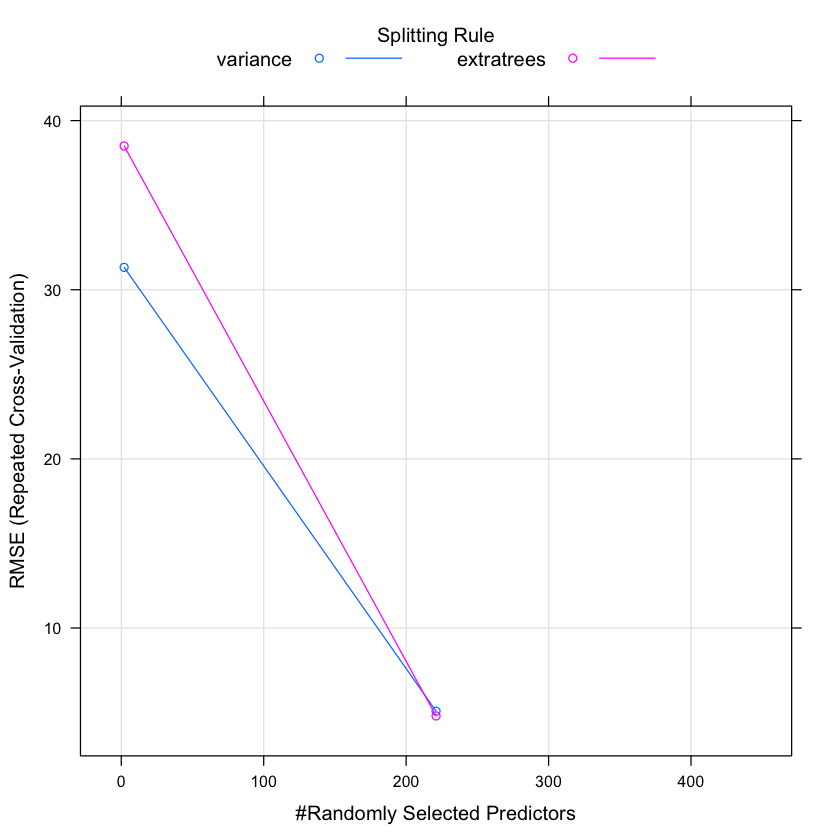

In [32]:
rf_fitlongitude
plot(rf_fitlongitude)

In [33]:
#test set
rf_Predlongi <- predict(rf_fitlongitude, newdata = testing)
rf_Predlongi
postResample(rf_Predlongi, testing$LONGITUDE)

[1] -7519.908 -7543.297 -7524.488 -7520.825 -7518.984 -7526.212 -7520.085
   [8] -7517.382 -7483.349 -7503.334 -7511.730 -7515.832 -7510.585 -7338.405
  [15] -7341.844 -7338.850 -7338.898 -7343.609 -7346.826 -7412.798 -7413.744
  [22] -7404.049 -7397.103 -7394.203 -7383.050 -7391.449 -7376.828 -7373.305
  [29] -7364.741 -7362.553 -7356.715 -7353.390 -7355.186 -7349.430 -7527.403
  [36] -7522.280 -7569.219 -7563.009 -7556.978 -7518.668 -7490.219 -7483.030
  [43] -7488.118 -7507.294 -7468.663 -7337.229 -7333.710 -7344.042 -7343.869
  [50] -7400.146 -7398.782 -7397.308 -7390.683 -7383.706 -7388.242 -7368.301
  [57] -7373.496 -7370.328 -7372.646 -7364.469 -7360.506 -7354.997 -7356.521
  [64] -7351.558 -7525.674 -7536.657 -7559.378 -7561.049 -7569.517 -7556.272
  [71] -7562.285 -7512.957 -7520.883 -7487.703 -7477.270 -7506.310 -7479.957
  [78] -7332.727 -7334.958 -7341.431 -7344.147 -7338.175 -7345.088 -7344.899
  [85] -7409.890 -7405.626 -7404.215 -7399.366 -7397.639 -7398.769 -7395.116
  [92] -7376.642 -7371.085 -7369.149 -7376.796 -7372.154 -7363.090 -7364.589
  [99] -7351.656 -7537.180 -7537.592 -7527.199 -7531.995 -7525.658 -7559.462
 [106] -7567.172 -7519.572 -7517.941 -7480.640 -7484.346 -7491.905 -7503.307
 [113] -7506.641 -7516.093 -7506.119 -7480.165 -7333.436 -7477.791 -7338.036
 [120] -7344.650 -7344.930 -7406.701 -7409.731 -7415.148 -7413.816 -7404.718
 [127] -7398.184 -7398.848 -7390.497 -7369.720 -7376.500 -7359.871 -7356.860
 [134] -7355.168 -7349.170 -7532.842 -7510.816 -7520.114 -7525.895 -7562.462
 [141] -7520.705 -7521.821 -7513.563 -7480.501 -7501.501 -7504.610 -7470.916
 [148] -7478.609 -7477.270 -7339.254 -7337.607 -7341.074 -7345.075 -7344.399
 [155] -7346.537 -7408.920 -7409.417 -7411.560 -7410.759 -7404.774 -7403.256
 [162] -7404.248 -7414.811 -7399.587 -7394.198 -7391.145 -7394.959 -7372.990
 [169] -7376.780 -7370.342 -7362.496 -7362.780 -7355.316 -7355.547 -7349.808
 [176] -7525.870 -7538.692 -7519.435 -7555.549 -7537.785 -7561.521 -7520.195
 [183] -7519.142 -7514.346 -7481.158 -7511.457 -7506.438 -7327.633 -7341.985
 [190] -7346.513 -7409.333 -7413.834 -7414.184 -7405.101 -7403.677 -7399.351
 [197] -7399.116 -7391.782 -7386.550 -7377.151 -7370.815 -7364.097 -7357.907
 [204] -7357.058 -7362.433 -7352.645 -7535.604 -7527.287 -7519.375 -7526.186
 [211] -7512.125 -7524.412 -7562.103 -7537.556 -7518.803 -7511.681 -7502.074
 [218] -7520.353 -7480.206 -7511.603 -7516.375 -7506.353 -7511.482 -7474.330
 [225] -7458.987 -7462.434 -7338.336 -7339.937 -7344.063 -7344.139 -7409.267
 [232] -7408.940 -7405.105 -7398.156 -7390.956 -7391.227 -7395.922 -7384.544
 [239] -7388.785 -7357.358 -7363.452 -7356.587 -7355.614 -7350.061 -7520.234
 [246] -7568.548 -7559.680 -7564.431 -7538.188 -7516.980 -7515.309 -7512.857
 [253] -7501.492 -7483.014 -7506.016 -7516.264 -7477.540 -7506.422 -7469.754
 [260] -7476.709 -7458.446 -7340.159 -7333.032 -7339.516 -7344.327 -7406.979
 [267] -7408.293 -7404.503 -7403.850 -7394.643 -7387.192 -7383.476 -7368.735
 [274] -7363.625 -7355.308 -7539.066 -7570.006 -7559.537 -7526.135 -7537.716
 [281] -7510.819 -7504.596 -7468.384 -7480.054 -7457.385 -7475.904 -7342.438
 [288] -7344.790 -7406.713 -7410.966 -7407.371 -7410.749 -7405.331 -7398.471
 [295] -7397.443 -7404.080 -7390.907 -7389.716 -7390.722 -7384.213 -7393.158
 [302] -7386.467 -7371.305 -7362.635 -7362.759 -7360.935 -7354.601 -7348.293
 [309] -7539.555 -7525.265 -7536.613 -7533.223 -7556.137 -7519.925 -7525.851
 [316] -7515.541 -7481.515 -7492.474 -7506.490 -7511.022 -7332.857 -7328.194
 [323] -7338.165 -7344.813 -7339.938 -7344.287 -7346.824 -7408.461 -7413.745
 [330] -7413.461 -7388.628 -7394.394 -7386.774 -7376.172 -7384.492 -7363.043
 [337] -7365.628 -7355.213 -7349.862 -7413.300 -7403.909 -7412.276 -7404.956
 [344] -7383.698 -7405.533 -7409.178 -7402.564 -7390.354 -7392.294 -7383.145
 [351] -7408.497 -7412.197 -7405.858 -7404.870 -7404.536 -7392.746 -7407.563
 [358] -7382.221 -7404.795 -7412.458 -7391.645 -7396.990 -7390.144 -7407.525

RMSE  Rsquared       MAE 
6.7555171 0.9970052 3.2389966

In [34]:
#validation data
rf_Predlonvd <- predict(rf_fitlongitude, newdata = tvalidationdata_noNAlon)
rf_Predlonvd
postResample(rf_Predlonvd, tvalidationdata_noNAlon$LONGITUDE)

[1] -7435.178 -7388.677 -7384.856 -7379.271 -7643.341 -7329.573 -7370.034
   [8] -7356.881 -7362.862 -7337.653 -7353.899 -7370.381 -7372.852 -7351.219
  [15] -7378.670 -7352.921 -7548.382 -7403.348 -7381.503 -7359.549 -7562.099
  [22] -7505.921 -7402.584 -7393.865 -7557.948 -7561.508 -7367.907 -7388.261
  [29] -7674.500 -7649.299 -7638.699 -7537.376 -7530.054 -7531.663 -7525.967
  [36] -7424.422 -7456.672 -7459.782 -7460.100 -7465.117 -7426.200 -7424.093
  [43] -7531.008 -7536.166 -7532.977 -7532.786 -7556.596 -7359.831 -7339.653
  [50] -7322.448 -7679.485 -7644.262 -7644.091 -7632.185 -7604.506 -7588.594
  [57] -7597.166 -7606.264 -7604.104 -7568.469 -7616.091 -7681.435 -7662.797
  [64] -7678.900 -7665.825 -7677.526 -7678.402 -7641.272 -7656.417 -7661.762
  [71] -7657.453 -7666.230 -7647.724 -7646.566 -7647.954 -7649.659 -7641.812
  [78] -7641.812 -7636.536 -7650.712 -7620.384 -7622.651 -7609.783 -7628.796
  [85] -7629.830 -7465.002 -7620.546 -7616.841 -7620.374 -7615.571 -7612.925
  [92] -7604.277 -7591.052 -7637.137 -7587.694 -7602.029 -7606.313 -7542.926
  [99] -7627.743 -7682.883 -7661.575 -7660.610 -7631.344 -7637.372 -7570.502
 [106] -7633.997 -7634.560 -7636.887 -7634.586 -7637.252 -7638.395 -7636.847
 [113] -7628.495 -7627.113 -7646.425 -7651.557 -7620.025 -7608.758 -7602.283
 [120] -7602.056 -7597.217 -7597.355 -7591.942 -7590.096 -7601.898 -7604.348
 [127] -7602.414 -7597.310 -7566.322 -7638.303 -7595.979 -7579.756 -7537.358
 [134] -7516.557 -7519.083 -7634.980 -7636.850 -7637.536 -7640.341 -7630.419
 [141] -7636.794 -7636.896 -7639.950 -7638.392 -7636.390 -7634.733 -7626.703
 [148] -7627.679 -7637.922 -7629.758 -7610.427 -7598.963 -7609.273 -7589.388
 [155] -7562.237 -7572.162 -7581.349 -7604.717 -7607.237 -7622.101 -7620.266
 [162] -7476.960 -7468.804 -7631.466 -7639.160 -7645.814 -7647.600 -7651.207
 [169] -7643.582 -7627.842 -7633.882 -7634.018 -7629.512 -7630.574 -7634.237
 [176] -7637.070 -7637.748 -7640.293 -7639.282 -7637.906 -7639.751 -7633.507
 [183] -7640.396 -7599.548 -7637.927 -7646.093 -7638.726 -7640.848 -7634.342
 [190] -7630.365 -7625.448 -7599.399 -7621.804 -7625.861 -7629.635 -7661.898
 [197] -7664.577 -7676.795 -7680.471 -7686.458 -7679.493 -7678.715 -7650.199
 [204] -7645.244 -7621.632 -7640.482 -7638.454 -7637.157 -7633.544 -7638.620
 [211] -7631.811 -7621.893 -7631.478 -7630.158 -7637.938 -7635.477 -7640.777
 [218] -7629.765 -7609.641 -7636.528 -7603.235 -7601.280 -7603.454 -7595.349
 [225] -7622.335 -7596.051 -7571.520 -7565.922 -7611.487 -7600.649 -7596.802
 [232] -7589.664 -7627.710 -7476.527 -7503.225 -7510.303 -7495.419 -7512.097
 [239] -7509.778 -7492.782 -7512.766 -7509.568 -7518.131 -7506.666 -7510.728
 [246] -7648.619 -7647.722 -7649.621 -7638.182 -7627.485 -7633.925 -7632.574
 [253] -7638.758 -7640.640 -7624.920 -7653.751 -7646.595 -7650.808 -7649.007
 [260] -7651.014 -7649.520 -7663.564 -7668.818 -7678.164 -7681.606 -7675.945
 [267] -7676.550 -7681.269 -7671.152 -7624.478 -7618.043 -7631.737 -7630.263
 [274] -7627.626 -7631.968 -7622.928 -7637.264 -7635.379 -7638.092 -7638.289
 [281] -7638.889 -7639.740 -7640.086 -7624.873 -7630.311 -7633.682 -7630.443
 [288] -7629.825 -7630.989 -7634.829 -7618.654 -7639.057 -7646.319 -7645.107
 [295] -7595.583 -7529.415 -7520.550 -7519.078 -7527.668 -7509.927 -7511.724
 [302] -7525.274 -7523.705 -7533.613 -7539.425 -7535.032 -7537.960 -7430.541
 [309] -7422.799 -7415.628 -7424.647 -7597.242 -7601.044 -7600.650 -7599.638
 [316] -7579.392 -7573.729 -7600.228 -7596.905 -7601.348 -7615.656 -7604.339
 [323] -7625.799 -7612.045 -7619.548 -7618.410 -7625.855 -7622.597 -7634.264
 [330] -7629.337 -7632.517 -7632.584 -7323.709 -7316.358 -7317.259 -7318.582
 [337] -7323.573 -7338.022 -7365.319 -7369.967 -7379.597 -7381.847 -7437.774
 [344] -7427.171 -7462.458 -7530.586 -7640.864 -7633.418 -7638.652 -7639.967
 [351] -7593.077 -7605.593 -7609.087 -7602.623 -7618.945 -7643.978 -7682.570
 [358] -7675.120 -7529.088 -7544.411 -7555.707 -7543.730 -7555.979 -7547.512

RMSE   Rsquared        MAE 
12.2309344  0.9900504  7.9350357

In [17]:
#SVM Model
## Building ID



ttraininingData_noNA <- dplyr::select(trainingData_noNA, -RELATIVEPOSITION, -USERID, 
                               -PHONEID, -TIMESTAMP, -LONGITUDE,
                               -LATITUDE,  -SPACEID, -FLOOR)


tvalidationdata_noNA <- dplyr::select(validationData_noNA, -RELATIVEPOSITION, -USERID, 
                                 -PHONEID, -TIMESTAMP, -LONGITUDE,
                                 -LATITUDE,  -SPACEID, -FLOOR)


set.seed(123)
data_partition <- createDataPartition(y=ttraininingData_noNA$BUILDINGID, p = .7, list = FALSE)
train = ttraininingData_noNA[sample(nrow(data_partition)),]
testing <- ttraininingData_noNA[-data_partition,]



set.seed(123)



svm_fit <- train(BUILDINGID ~., data = train,
                method='svmLinear',
                preProcess = c('zv'),
                trControl = ctrl)
svm_fit
plot(svm_fit)

Support Vector Machines with Linear Kernel 

13904 samples
  465 predictor
    3 classes: '0', '1', '2' 

Pre-processing: remove (25) 
Resampling: Cross-Validated (5 fold, repeated 3 times) 
Summary of sample sizes: 11123, 11123, 11124, 11123, 11123, 11123, ... 
Resampling results:

  Accuracy  Kappa
  1         1    

Tuning parameter 'C' was held constant at a value of 1

ERROR: Error in plot.train(svm_fit): There are no tuning parameters with more than 1 value.


[1] 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1
  [38] 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 2
  [75] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2
 [112] 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2
 [149] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2
 [186] 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [223] 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [260] 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1
 [297] 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [334] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [371] 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [408] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [445] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [482] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [519] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [556] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [593] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [630] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [667] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [704] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [741] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [778] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [815] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [852] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [889] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [926] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [963] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2
[1000] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2
[1037] 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1074] 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1111] 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1
[1148] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1
[1185] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1222] 2 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1259] 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1296] 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2
[1333] 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2
[1370] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 2 2 2 2 1 2 1 2 1 1 1 1 2 2 2 2 2
[1407] 2 2 2 2 2 2 1 1 1 1 2 2 2 2 2 2 2 1 1 1 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1
[1444] 2 2 2 2 2 2 2 1 1 2 2 2 2 2 2 2 2 1 1 2 2 2 2 1 1 1 1 1 1 1 2 2 2 2 2 2 2
[1481] 2 2 2 2 2 1 1 1 1 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1
[1518] 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2
[1555] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2
[1592] 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2
[1629] 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1
[1666] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1703] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1740] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1777] 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 1 1 1
[1814] 1 1 1 1 1 1 1 1 1 1 2 2 2 2

Confusion Matrix and Statistics

          Reference
Prediction    0    1    2
         0 1574    0    0
         1    0 1532    0
         2    0   15 2836

Overall Statistics
                                          
               Accuracy : 0.9975          
                 95% CI : (0.9959, 0.9986)
    No Information Rate : 0.4761          
    P-Value [Acc > NIR] : < 2.2e-16       
                                          
                  Kappa : 0.996           
 Mcnemar's Test P-Value : NA              

Statistics by Class:

                     Class: 0 Class: 1 Class: 2
Sensitivity            1.0000   0.9903   1.0000
Specificity            1.0000   1.0000   0.9952
Pos Pred Value         1.0000   1.0000   0.9947
Neg Pred Value         1.0000   0.9966   1.0000
Prevalence             0.2642   0.2597   0.4761
Detection Rate         0.2642   0.2572   0.4761
Detection Prevalence   0.2642   0.2572   0.4786
Balanced Accuracy      1.0000   0.9952   0.9976

Accuracy    Kappa 
0.997482 0.996038

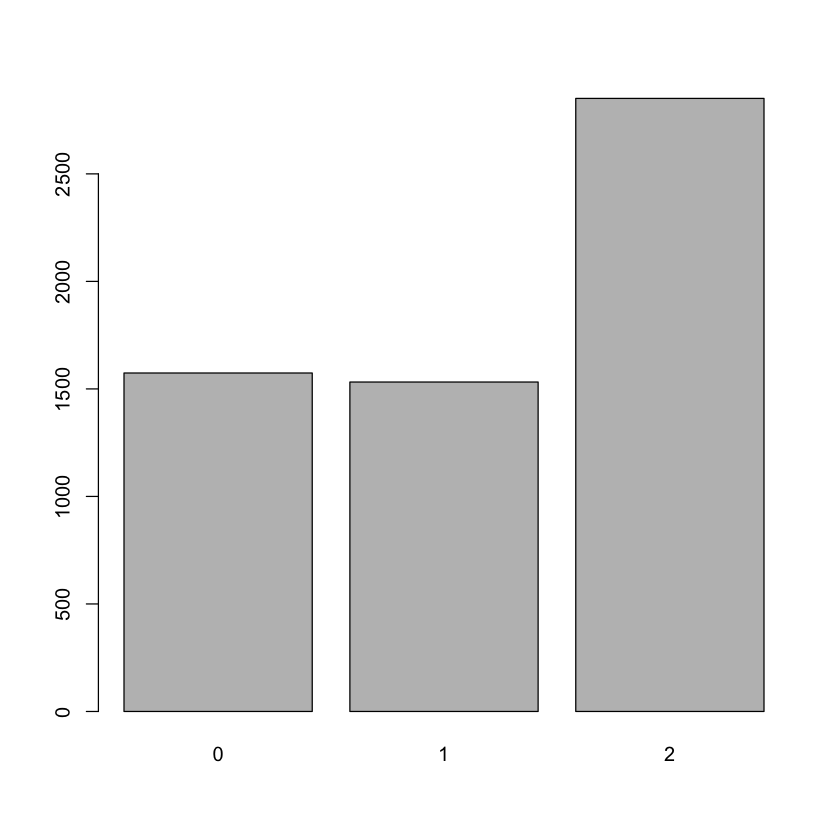

In [18]:
#testset

svm_Pred <- predict(svm_fit, newdata = testing)
svm_Pred
plot(svm_Pred)
svm_CM <-confusionMatrix(svm_Pred, testing$BUILDINGID)
svm_CM
postResample(svm_Pred, testing$BUILDINGID)

In [19]:
# validation set
svm_Predvd <- predict(svm_fit, newdata = tvalidationdata_noNA)
svm_Pred
svm_CM <-confusionMatrix(svm_Pred, testing$BUILDINGID)
svm_CM
postResample(svm_Pred, testing$BUILDINGID)

[1] 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1
  [38] 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 2
  [75] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2
 [112] 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2
 [149] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2
 [186] 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [223] 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [260] 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1
 [297] 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [334] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [371] 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [408] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [445] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [482] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [519] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [556] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [593] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [630] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [667] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [704] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [741] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [778] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [815] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [852] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [889] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [926] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [963] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2
[1000] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2
[1037] 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1074] 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1111] 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1
[1148] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1
[1185] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1222] 2 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1259] 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1296] 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2
[1333] 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2
[1370] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 2 2 2 2 1 2 1 2 1 1 1 1 2 2 2 2 2
[1407] 2 2 2 2 2 2 1 1 1 1 2 2 2 2 2 2 2 1 1 1 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1
[1444] 2 2 2 2 2 2 2 1 1 2 2 2 2 2 2 2 2 1 1 2 2 2 2 1 1 1 1 1 1 1 2 2 2 2 2 2 2
[1481] 2 2 2 2 2 1 1 1 1 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1
[1518] 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2
[1555] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2
[1592] 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2
[1629] 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1
[1666] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1703] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1740] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[1777] 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 1 1 1
[1814] 1 1 1 1 1 1 1 1 1 1 2 2 2 2

Confusion Matrix and Statistics

          Reference
Prediction    0    1    2
         0 1574    0    0
         1    0 1532    0
         2    0   15 2836

Overall Statistics
                                          
               Accuracy : 0.9975          
                 95% CI : (0.9959, 0.9986)
    No Information Rate : 0.4761          
    P-Value [Acc > NIR] : < 2.2e-16       
                                          
                  Kappa : 0.996           
 Mcnemar's Test P-Value : NA              

Statistics by Class:

                     Class: 0 Class: 1 Class: 2
Sensitivity            1.0000   0.9903   1.0000
Specificity            1.0000   1.0000   0.9952
Pos Pred Value         1.0000   1.0000   0.9947
Neg Pred Value         1.0000   0.9966   1.0000
Prevalence             0.2642   0.2597   0.4761
Detection Rate         0.2642   0.2572   0.4761
Detection Prevalence   0.2642   0.2572   0.4786
Balanced Accuracy      1.0000   0.9952   0.9976

Accuracy    Kappa 
0.997482 0.996038

In [20]:
#Floor
ttraininingData_noNAFL <- dplyr::select(trainingData_noNA, -RELATIVEPOSITION, -USERID, 
                               -PHONEID, -TIMESTAMP, -LONGITUDE,
                               -LATITUDE,  -SPACEID, -BUILDINGID)


tvalidationdata_noNAFL <- dplyr::select(validationData_noNA, -RELATIVEPOSITION, -USERID, 
                               -PHONEID, -TIMESTAMP, -LONGITUDE,
                               -LATITUDE,  -SPACEID, -BUILDINGID)


set.seed(123)
data_partition <- caret::createDataPartition(y=ttraininingData_noNAFL$FLOOR, p = .7, list = FALSE)
train = ttraininingData_noNAFL[sample(nrow(data_partition)),]
testing <- ttraininingData_noNAFL[-data_partition,]

svm_fitfloor <- train(FLOOR ~., data = train,
                      method='svmLinear',
                      preProcess = c('zv'),
                      trControl = ctrl)
svm_fitfloor
plot(svm_fitfloor)

Support Vector Machines with Linear Kernel 

13905 samples
  465 predictor
    5 classes: '0', '1', '2', '3', '4' 

Pre-processing: remove (25) 
Resampling: Cross-Validated (5 fold, repeated 3 times) 
Summary of sample sizes: 11124, 11125, 11124, 11124, 11123, 11123, ... 
Resampling results:

  Accuracy   Kappa    
  0.9956609  0.9944282

Tuning parameter 'C' was held constant at a value of 1

ERROR: Error in plot.train(svm_fitfloor): There are no tuning parameters with more than 1 value.


In [21]:
#test set
svm_Predfloor <- predict(svm_fitfloor, newdata = testing)
svm_Predfloor
svm_CMF <-confusionMatrix(svm_Predfloor, testing$FLOOR)
svm_CMF
postResample(svm_Predfloor, testing$FLOOR)


[1] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2
  [38] 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2
  [75] 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 2 2 2 2 2 2 2
 [112] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3
 [149] 3 3 3 3 3 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2
 [186] 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2
 [223] 2 2 2 2 2 2 2 3 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2
 [260] 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 2 2 2 2 2
 [297] 2 2 2 2 2 2 2 3 3 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4
 [334] 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 [371] 4 4 4 4 4 4 4 4 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [408] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [445] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [482] 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 2
 [519] 3 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 3 3 3 3 3 3 3 3
 [556] 3 3 3 3 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3
 [593] 3 3 3 3 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3
 [630] 3 3 3 3 3 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3
 [667] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3
 [704] 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 4 3 3 3 3 3 3 3 3 3
 [741] 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 [778] 3 4 4 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 3
 [815] 4 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 3 3 3 3 4 4 4 4
 [852] 4 4 4 4 4 4 4 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 [889] 4 4 4 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 3 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 3
 [926] 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 0 4 0 0 0 0 0 0 0 0 0 0 0 0 0
 [963] 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1
[1000] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0
[1037] 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1074] 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1111] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1
[1148] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1185] 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0
[1222] 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1259] 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1296] 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1333] 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[1370] 1 1 1 1 1 1 3 3 0 0 0 0 0 0 0 3 3 3 3 3 3 0 0 0 0 0 0 0 0 0 3 0 3 3 3 3 3
[1407] 3 0 0 0 0 0 0 3 3 3 0 3 3 3 0 0 0 0 0 0 0 0 0 3 3 3 3 3 3 0 0 0 0 0 0 0 0
[1444] 0 0 0 0 3 3 3 3 3 3 0 0 0 0 0 0 0 0 3 3 3 3 3 0 0 0 0 0 0 0 0 0 0 0 0 0 3
[1481] 3 3 3 3 3 3 0 0 0 0 0 0 0 0 0 0 0 0 3 3 0 3 3 3 0 0 0 0 0 0 0 0 0 3 0 3 3
[1518] 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 3 2 3 3 3 3 3 3 3 0 0 0 0 0 0 0 0 0
[1555] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 3 3 2 2 2 2 2 2 2 2 2 3 0 3 3 0 0 0 0
[1592] 0 0 2 3 2 2 2 2 2 2 2 2 2 3 3 3 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0
[1629] 0 2 3 2 2 2 2 3 2 3 3 3 3 3 3 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 3 3
[1666] 3 2 2 2 2 2 2 2 2 3 3 3 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2
[1703] 3 3 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 3 2 2 2 2 2 2 2 2 2 3 3 3
[1740] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 3 3 2 2 2 2 2 2 2 3 3 3 0 0 0 0 0 0 0 0 0 0
[1777] 0 0 0 0 0 0 0 2 0 2 2 2 3 3 3 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 0 0 0 0 0 0 0
[1814] 0 0 0 0 0 0 0 2 2 2 2 2 2 2

Confusion Matrix and Statistics

          Reference
Prediction    0    1    2    3    4
         0 1253   27    1   15    0
         1   40 1400    8    0    0
         2    6   73 1289   56    0
         3    0    0   26 1432    0
         4    0    0    0    0  330

Overall Statistics
                                          
               Accuracy : 0.9577          
                 95% CI : (0.9523, 0.9627)
    No Information Rate : 0.2524          
    P-Value [Acc > NIR] : < 2.2e-16       
                                          
                  Kappa : 0.9453          
 Mcnemar's Test P-Value : NA              

Statistics by Class:

                     Class: 0 Class: 1 Class: 2 Class: 3 Class: 4
Sensitivity            0.9646   0.9333   0.9736   0.9528  1.00000
Specificity            0.9908   0.9892   0.9709   0.9942  1.00000
Pos Pred Value         0.9668   0.9669   0.9052   0.9822  1.00000
Neg Pred Value         0.9901   0.9778   0.9923   0.9842  1.00000
Prevalence    

Accuracy     Kappa 
0.9576897 0.9452876

In [22]:
#validation data

svm_Predfloorvd <- predict(svm_fitfloor, newdata = tvalidationdata_noNAFL)
svm_Predfloorvd
postResample(svm_Predfloorvd, tvalidationdata_noNAFL$FLOOR)


[1] 0 4 4 4 2 2 3 4 2 0 2 0 0 2 0 1 3 4 1 1 2 0 4 4 1 1 1 1 2 2 1 2 2 2 2 2 3
  [38] 3 3 3 3 3 3 3 3 3 3 3 3 3 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0
  [75] 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0
 [112] 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1
 [149] 1 0 0 0 0 0 2 2 2 2 2 2 2 0 0 3 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 2 1 2 1 2 1
 [186] 2 1 1 2 0 0 2 1 1 1 3 3 3 3 3 3 3 3 3 1 3 3 3 3 3 3 3 3 3 3 3 3 1 1 3 1 1
 [223] 1 1 3 1 1 1 3 3 3 3 3 0 0 0 0 2 2 0 2 0 2 2 2 1 1 1 0 1 1 1 1 2 2 2 2 2 2
 [260] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 0 1 1
 [297] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [334] 1 1 1 1 1 1 1 1 1 0 0 0 0 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 2 2 2 2
 [371] 2 2 2 0 2 2 2 2 2 1 1 1 1 1 1 1 1 1 2 1 1 1 2 1 1 2 1 1 3 1 2 1 3 1 1 1 1
 [408] 1 2 2 0 1 1 1 2 1 1 2 1 2 2 2 2 2 3 2 2 2 2 2 2 2 2 2 2 2 1 2 2 1 1 3 2 1
 [445] 2 2 1 2 2 3 2 1 2 1 3 2 2 1 1 1 1 2 2 2 2 1 1 2 2 2 2 1 2 2 2 2 1 2 0 1 2
 [482] 1 2 2 2 1 2 1 3 2 2 0 2 1 1 2 1 2 2 1 1 1 1 0 3 1 2 1 2 1 0 0 2 1 0 2 2 1
 [519] 1 1 2 1 1 2 0 3 2 1 2 2 0 3 2 2 1 3 1 0 1 1 2 2 1 0 3 2 1 1 1 2 2 1 1 3 3
 [556] 1 0 0 3 1 1 3 0 0 3 1 1 0 1 3 1 3 2 3 2 3 2 2 1 3 1 2 3 2 1 3 2 1 3 1 1 1
 [593] 2 1 1 3 3 2 3 3 0 3 0 2 3 3 2 3 3 1 3 3 0 1 2 2 3 0 0 2 1 0 3 3 2 2 3 3 3
 [630] 1 0 2 1 0 1 2 2 3 3 1 2 1 0 3 2 2 0 1 1 3 3 0 1 0 1 2 3 1 2 0 0 1 2 1 1 3
 [667] 2 1 2 1 0 1 1 2 2 1 0 2 1 0 1 1 3 1 1 2 1 0 2 2 1 0 2 1 2 1 2 2 2 2 0 2 3
 [704] 2 3 3 0 0 2 0 3 1 0 2 1 1 1 1 1 1 1 1 0 1 2 1 2 0 1 2 0 2 1 1 1 2 2 0 1 1
 [741] 0 2 2 1 2 2 1 2 0 1 2 2 1 2 3 2 2 2 1 0 1 2 2 3 2 0 2 0 4 2 2 2 2 0 2 0 1
 [778] 0 0 2 0 1 2 1 2 2 2 2 1 1 2 3 2 2 3 2 2 2 1 0 2 3 2 2 0 3 3 1 1 2 2 2 2 1
 [815] 4 1 2 3 2 2 2 2 2 2 1 1 2 1 3 4 2 2 1 2 1 1 1 1 2 2 1 3 2 1 3 1 4 1 2 4 2
 [852] 2 1 4 2 3 2 2 1 2 3 2 1 1 1 2 4 2 1 1 1 1 1 2 1 1 2 4 1 2 1 0 2 1 1 1 4 1
 [889] 3 1 1 1 4 3 1 1 4 2 1 0 4 1 1 2 1 3 0 4 2 2 1 1 4 2 1 0 2 2 0 2 2 1 2 2 1
 [926] 1 2 2 1 2 2 0 1 2 2 0 1 1 2 2 3 1 3 1 2 2 2 1 0 3 2 2 2 1 3 2 2 3 1 1 3 1
 [963] 1 1 3 1 2 1 2 1 4 2 2 0 2 2 3 4 2 0 1 2 3 2 4 1 3 1 2 2 3 1 0 2 4 4 2 1 4
[1000] 1 4 1 0 4 1 1 1 1 4 0 0 1 2 4 1 1 0 0 1 1 1 0 0 1 1 1 0 1 1 1 0 1 0 1 1 1
[1037] 1 1 1 1 1 1 1 1 2 1 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 3 2 3 3 3 3 3 3 3 3
[1074] 3 3 3 3 3 4 4 4 4 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0
[1111] 0
Levels: 0 1 2 3 4

Accuracy     Kappa 
0.8937894 0.8522633

In [ ]:
#latitude
ttraininingData_noNAlat <- dplyr::select(trainingData_noNA, -RELATIVEPOSITION, -USERID, 
                                 -PHONEID, -TIMESTAMP, -LONGITUDE,
                                 -FLOOR,  -SPACEID, -BUILDINGID)


tvalidationdata_noNAlat <- dplyr::select(validationData_noNA, -RELATIVEPOSITION, -USERID, 
                                 -PHONEID, -TIMESTAMP, -LONGITUDE,
                                 -FLOOR,  -SPACEID, -BUILDINGID)


data_partition <- caret::createDataPartition(y=ttraininingData_noNAlat$LATITUDE, p = .7, list = FALSE)
trainlat = ttraininingData_noNAlat[sample(nrow(data_partition)),]
testinglat <- ttraininingData_noNAlat[-data_partition,]

set.seed (123)
svm_fitlatitude <- train(LATITUDE ~., data = trainlat,
                         method='svmLinear',
                         preProcess = c('zv'),
                         trControl = ctrl)

svm_fitlatitude


In [ ]:
# test data
svm_Predlatitude <- predict(svm_fitlatitude, newdata = testinglat)
svm_Predlatitude
postResample(svm_Predlatitude, testinglat$LATITUDE)

In [ ]:
#validation data
svm_Predlatvd <- predict(svm_fitlatitude, newdata = tvalidationdata_noNAlat)
svm_Predlatvd
postResample(svm_Predlatvd, tvalidationdata_noNAlat$LATITUDE)

In [ ]:
# Longitude

ttraininingData_noNAlon <- dplyr ::select(trainingData_noNA, -RELATIVEPOSITION, -USERID, 
                                  -PHONEID, -TIMESTAMP, -LATITUDE,
                                  -FLOOR,  -SPACEID, -BUILDINGID)
tvalidationdata_noNAlon <- dplyr::select(validationData_noNA, -RELATIVEPOSITION, -USERID, 
                                  -PHONEID, -TIMESTAMP, -LATITUDE,
                                  -FLOOR,  -SPACEID, -BUILDINGID)


set.seed(123)
data_partition <- caret::createDataPartition(y=ttraininingData_noNAlon$LONGITUDE, p = .7, list = FALSE)
train = ttraininingData_noNAlon[sample(nrow(data_partition)),]
testing <- ttraininingData_noNAlon[-data_partition,]

svm_fitlongitude <- train(LONGITUDE ~., data = train,
                          method='svmLinear',
                          preProcess = c('zv'),
                          trControl = ctrl)
svm_fitlongitude

In [ ]:
#test data
svm_Predlongi <- predict(svm_fitlongitude, newdata = testing)
svm_Predlongi

postResample(svm_Predlongi, testing$LONGITUDE)

In [ ]:
#test data
svm_Predlongi <- predict(svm_fitlongitude, newdata = testing)
svm_Predlongi

postResample(svm_Predlongi, testing$LONGITUDE)

In [1]:
#summary results classificateion
#buildings
results <- resamples(list(kNN=knn_fit,
                          RF=rf_fit,
                          svm= svm_fit,
                          C5.0=d_fit))
summary(results)
plot(results)
bwplot(results)

ERROR: Error in resamples(list(kNN = knn_fit, RF = rf_fit, svm = svm_fit, C5.0 = d_fit)): could not find function "resamples"


In [ ]:
# Floor 
resultsfloor <- resamples(list(kNN=knn_fitfloor,
                               c5.0 = d_fitfloor,
                               svm = svm_fit,
                               RF = rf_fitfloor))

summary(resultsfloor)
bwplot(resultsfloor)

In [ ]:
#latitude
resultslatitude <- resamples(list(knn=knn_fitlatitude,
                                  RF = rf_fitlatitude,
                                  svm = svm_fitlatitude))
summary(resultslatitude)
bwplot(resultslatitude)

In [ ]:
#longitude
resultslongitude <- resamples(list(knn= knn_fitlongitude,
                                   RF = rf_fitlongitude,
                                   svm = svm_fitlongitude))
summary(resultslongitude)
bwplot(resultslongitude)

In [ ]:
#Distribution of distance error (in meters)
Error = sqrt((knn_Predlonvd - validationData_noNA$LONGITUDE)^2
             +(knn_Predlatvd - validationData_noNA$LATITUDE)^2)

mean(Error)

In [ ]:
hypotenuse(6.12,5.75)

In [21]:
hist(Error, freq = T, xlab = " Absolute error (m)", 
     main = "Error distance in meters (Buildings)")
summary ('Error')

ERROR: Error in hist(Error, freq = T, xlab = " Absolute error (m)", main = "Error distance in meters (Buildings)"): object 'Error' not found


In [ ]:
plot_ly(x = validationData_noNA$LONGITUDE, y=validationData_noNA$LATITUDE, z=validationData_noNA$FLOOR, 
                 type="scatter3d", mode="markers", color = validationData_noNA$FLOOR) %>%
  add_markers() %>% layout(scene = list(xaxis = list(title = 'Longitude'),
                                        yaxis = list(title = 'Latitude'),
                                        zaxis = list(title = 'Floor'

In [ ]:
plot_ly(x = knn_Predlonvd, y=knn_Predlatvd, z=knn_Predfloorvd, 
                type="scatter3d", mode="markers", color = knn_Predfloorvd) %>%
  add_markers() %>% layout(scene = list(xaxis = list(title = 'Longitude'),
                                        yaxis = list(title = 'Latitude'),
                                        zaxis = list(title = 'Floor')))